In [11]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
from sklearn import preprocessing
import time 
from sklearn.manifold import TSNE

In [37]:
#load customers
customers = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_customers_dataset.csv")
customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [38]:
#load geolocalisation
geolocalisation = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_geolocation_dataset.csv")
geolocalisation["customer_zip_code_prefix"] = geolocalisation["geolocation_zip_code_prefix"] 
mergedFrame = pd.merge(customers, geolocalisation, how="inner")
mergedFrame = mergedFrame.drop(columns=["geolocation_zip_code_prefix", "geolocation_lat", "geolocation_state", "geolocation_lng", "geolocation_city"]) 
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
2,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
3,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
4,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
...,...,...,...,...,...
15083450,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO
15083451,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO
15083452,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO
15083453,6fb4f2354f36e554ac80141e9128f528,3cc6f2e1b9199837fabb35ff4bf24884,99043,passo fundo,RS


In [39]:
#orders
orders = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_orders_dataset.csv")
mergedFrame = pd.merge(mergedFrame, orders, how="inner")
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
1,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
2,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
3,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
4,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
15083450,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,2018-02-20 17:48:37,2018-02-19 00:00:00
15083451,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,2018-02-20 17:48:37,2018-02-19 00:00:00
15083452,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,2018-02-20 17:48:37,2018-02-19 00:00:00
15083453,6fb4f2354f36e554ac80141e9128f528,3cc6f2e1b9199837fabb35ff4bf24884,99043,passo fundo,RS,ab042583eff2cb1ffe2110a95da95d4b,delivered,2018-01-22 12:02:21,2018-01-22 14:19:01,2018-01-24 14:36:32,2018-02-07 21:22:40,2018-02-22 00:00:00


In [40]:
#order item
items = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_order_items_dataset.csv")
mergedFrame = pd.merge(mergedFrame, items, how="inner")
mergedFrame = mergedFrame.drop_duplicates()
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88
147,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,95261f608a64bbbe760a212b4d48a4ee,delivered,2018-06-15 20:07:13,2018-06-15 20:41:11,2018-06-18 15:52:00,2018-06-21 12:18:32,2018-07-05 00:00:00,1,99a4788cb24856965c36a24e339b6058,4a3ca9315b744ce9f8e9374361493884,2018-06-19 20:30:41,79.90,14.87
294,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,9444fa2ab50a3f5af63b48be297eda24,delivered,2017-09-09 15:40:00,2017-09-09 15:50:24,2017-09-11 13:43:41,2017-09-18 20:21:42,2017-10-02 00:00:00,1,83fe1ea6fd12c51fcd341a9968e65cc3,a3a38f4affed601eb87a97788c949667,2017-09-14 15:50:24,44.90,17.60
441,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,dceb8e88274c6f42a88a76ed979eb817,delivered,2018-03-26 12:04:55,2018-03-26 12:15:37,2018-03-27 00:54:33,2018-03-28 19:27:01,2018-04-12 00:00:00,1,ccb3df28522945422e24b108603a1d04,39d54ff918774174706fb065d7f9dc07,2018-03-30 12:15:37,19.90,12.79
588,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,6ee1cea1b2edcc713f83ebfbccbc57f9,delivered,2018-07-29 20:39:20,2018-07-29 20:55:21,2018-07-31 12:39:00,2018-08-03 16:48:40,2018-08-09 00:00:00,1,cb7d42475660f66a519c76f55715cd32,bd0a1b0aadca9a83d9304f7e8ff5fbd5,2018-08-02 20:55:21,63.90,13.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17195851,0b7a30ba373aeb55cf28add5b5477956,8c8173e547e020f411aa55b2fceed861,87145,paicandu,PR,e12f5458c6b4f349a97fbf22e08d17ac,delivered,2017-08-01 12:57:02,2017-08-02 03:03:55,2017-08-02 17:47:19,2017-08-15 13:54:33,2017-08-23 00:00:00,1,494c9e9cadda96141fec59b218afc773,7142540dd4c91e2237acb7e911c4eba2,2017-08-08 03:03:55,59.90,17.67
17195853,ff6b440b2465bfaef05c675efb48cd15,e38a27b979a552e019e297ecc22dc67b,98860,eugenio de castro,RS,82a11e82ea02c7e3381366e935c1126e,delivered,2018-05-23 09:07:46,2018-05-25 02:54:54,2018-05-25 12:11:00,2018-06-06 16:18:51,2018-06-07 00:00:00,1,bfc275f6de912665e4dcd8da32f43c10,71271995e85f5b8530be99ed54a91b89,2018-05-31 02:54:54,97.00,14.76
17195859,3f7029d9b98a47370cd5f3a97adcbccd,5894d202cc869b4ec460fce3c6ed8cb5,5538,sao paulo,SP,6e9f8d6156d8c37f0e0e6351908de639,delivered,2018-03-28 12:28:04,2018-03-28 12:47:35,2018-03-29 19:19:06,2018-04-10 13:40:54,2018-04-16 00:00:00,1,30715b45872148dd5322eb2989228a43,4a3ca9315b744ce9f8e9374361493884,2018-04-03 12:47:35,61.80,13.79
17195866,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,2018-02-20 17:48:37,2018-02-19 00:00:00,1,acc444eb5ad26f79d5a11baa6a03c439,1025f0e2d44d7041d6cf58b6550e0bfa,2018-01-30 18:12:41,120.00,39.77


In [41]:
#payments
payments = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_order_payments_dataset.csv")
mergedFrame = pd.merge(mergedFrame, payments, how="inner")
mergedFrame = mergedFrame.drop_duplicates()
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,1,credit_card,2,146.87
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,95261f608a64bbbe760a212b4d48a4ee,delivered,2018-06-15 20:07:13,2018-06-15 20:41:11,2018-06-18 15:52:00,...,1,99a4788cb24856965c36a24e339b6058,4a3ca9315b744ce9f8e9374361493884,2018-06-19 20:30:41,79.90,14.87,1,credit_card,8,94.77
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,9444fa2ab50a3f5af63b48be297eda24,delivered,2017-09-09 15:40:00,2017-09-09 15:50:24,2017-09-11 13:43:41,...,1,83fe1ea6fd12c51fcd341a9968e65cc3,a3a38f4affed601eb87a97788c949667,2017-09-14 15:50:24,44.90,17.60,1,credit_card,1,62.50
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,dceb8e88274c6f42a88a76ed979eb817,delivered,2018-03-26 12:04:55,2018-03-26 12:15:37,2018-03-27 00:54:33,...,1,ccb3df28522945422e24b108603a1d04,39d54ff918774174706fb065d7f9dc07,2018-03-30 12:15:37,19.90,12.79,1,credit_card,3,32.69
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,6ee1cea1b2edcc713f83ebfbccbc57f9,delivered,2018-07-29 20:39:20,2018-07-29 20:55:21,2018-07-31 12:39:00,...,1,cb7d42475660f66a519c76f55715cd32,bd0a1b0aadca9a83d9304f7e8ff5fbd5,2018-08-02 20:55:21,63.90,13.11,1,credit_card,1,77.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117284,0b7a30ba373aeb55cf28add5b5477956,8c8173e547e020f411aa55b2fceed861,87145,paicandu,PR,e12f5458c6b4f349a97fbf22e08d17ac,delivered,2017-08-01 12:57:02,2017-08-02 03:03:55,2017-08-02 17:47:19,...,1,494c9e9cadda96141fec59b218afc773,7142540dd4c91e2237acb7e911c4eba2,2017-08-08 03:03:55,59.90,17.67,1,boleto,1,77.57
117285,ff6b440b2465bfaef05c675efb48cd15,e38a27b979a552e019e297ecc22dc67b,98860,eugenio de castro,RS,82a11e82ea02c7e3381366e935c1126e,delivered,2018-05-23 09:07:46,2018-05-25 02:54:54,2018-05-25 12:11:00,...,1,bfc275f6de912665e4dcd8da32f43c10,71271995e85f5b8530be99ed54a91b89,2018-05-31 02:54:54,97.00,14.76,1,boleto,1,111.76
117286,3f7029d9b98a47370cd5f3a97adcbccd,5894d202cc869b4ec460fce3c6ed8cb5,5538,sao paulo,SP,6e9f8d6156d8c37f0e0e6351908de639,delivered,2018-03-28 12:28:04,2018-03-28 12:47:35,2018-03-29 19:19:06,...,1,30715b45872148dd5322eb2989228a43,4a3ca9315b744ce9f8e9374361493884,2018-04-03 12:47:35,61.80,13.79,1,credit_card,3,75.59
117287,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,...,1,acc444eb5ad26f79d5a11baa6a03c439,1025f0e2d44d7041d6cf58b6550e0bfa,2018-01-30 18:12:41,120.00,39.77,1,credit_card,3,159.77


In [42]:
#reviews
reviews = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_order_reviews_dataset.csv")
mergedFrame = pd.merge(mergedFrame, reviews, how="inner")
mergedFrame = mergedFrame.drop_duplicates()
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,1,credit_card,2,146.87,88b8b52d46df026a9d1ad2136a59b30b,4,NaN,NaN,2017-05-26 00:00:00,2017-05-30 22:34:40
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,95261f608a64bbbe760a212b4d48a4ee,delivered,2018-06-15 20:07:13,2018-06-15 20:41:11,2018-06-18 15:52:00,...,1,credit_card,8,94.77,16a27e5ffd29a7cdf0e4984b0cab46b7,5,super recomendo,NaN,2018-06-22 00:00:00,2018-06-26 19:17:40
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,9444fa2ab50a3f5af63b48be297eda24,delivered,2017-09-09 15:40:00,2017-09-09 15:50:24,2017-09-11 13:43:41,...,1,credit_card,1,62.50,23be511c12a57fe4052555f9c8905d8b,5,NaN,NaN,2017-09-19 00:00:00,2017-09-20 03:47:39
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,dceb8e88274c6f42a88a76ed979eb817,delivered,2018-03-26 12:04:55,2018-03-26 12:15:37,2018-03-27 00:54:33,...,1,credit_card,3,32.69,e0fd752f37c8c6866ceb53b79b0715f6,5,NaN,NaN,2018-03-29 00:00:00,2018-04-11 20:07:14
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,6ee1cea1b2edcc713f83ebfbccbc57f9,delivered,2018-07-29 20:39:20,2018-07-29 20:55:21,2018-07-31 12:39:00,...,1,credit_card,1,77.01,51fb9267e6687e5ab21e4539999188ed,5,NaN,NaN,2018-08-04 00:00:00,2018-08-04 23:20:25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117993,0b7a30ba373aeb55cf28add5b5477956,8c8173e547e020f411aa55b2fceed861,87145,paicandu,PR,e12f5458c6b4f349a97fbf22e08d17ac,delivered,2017-08-01 12:57:02,2017-08-02 03:03:55,2017-08-02 17:47:19,...,1,boleto,1,77.57,ea9662b9a368e2441a096b94f23e0794,5,NaN,muito bom comprar com voces,2017-08-16 00:00:00,2017-08-16 19:29:34
117994,ff6b440b2465bfaef05c675efb48cd15,e38a27b979a552e019e297ecc22dc67b,98860,eugenio de castro,RS,82a11e82ea02c7e3381366e935c1126e,delivered,2018-05-23 09:07:46,2018-05-25 02:54:54,2018-05-25 12:11:00,...,1,boleto,1,111.76,e3be0c4025111e8c548a10f528aa9766,5,NaN,NaN,2018-06-07 00:00:00,2018-06-11 17:00:28
117995,3f7029d9b98a47370cd5f3a97adcbccd,5894d202cc869b4ec460fce3c6ed8cb5,5538,sao paulo,SP,6e9f8d6156d8c37f0e0e6351908de639,delivered,2018-03-28 12:28:04,2018-03-28 12:47:35,2018-03-29 19:19:06,...,1,credit_card,3,75.59,6a006eae4bb9b6af9a6cb5b078b5a81d,5,NaN,Muito bom,2018-04-11 00:00:00,2018-04-11 17:21:07
117996,d9110683c7a282144e9fc97660026a28,5cbfdb85ec130898108b32c50d619c39,74980,aparecida de goiania,GO,e65fa5f31ce4436d38bcf5e109fd43e4,delivered,2018-01-24 17:53:44,2018-01-24 18:12:41,2018-01-30 15:13:39,...,1,credit_card,3,159.77,09490ce09a832d45f17268af115c9e5c,5,NaN,NaN,2018-02-21 00:00:00,2018-02-21 10:43:09


In [43]:
#products
products = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_products_dataset.csv")
mergedFrame = pd.merge(mergedFrame, products, how="inner")
mergedFrame = mergedFrame.drop_duplicates()
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,2017-05-26 00:00:00,2017-05-30 22:34:40,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0
1,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,2018-02-15 00:00:00,2018-03-15 18:15:00,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0
2,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,2018-02-15 00:00:00,2018-03-15 18:15:00,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0
3,44e25679aa4d5d2ef5103f6b0174a586,613259d64ba972e49dc25b019b7918c3,6414,barueri,SP,03afb3c10af52ddfa3c33b9881bf43f8,delivered,2017-12-07 16:41:50,2017-12-07 16:51:57,2017-12-15 13:04:12,...,2017-12-19 00:00:00,2017-12-21 21:48:38,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0
4,ac318397fb90e64c9a724a3fc61ef587,aaad33c5051196b5e73c7d65b9072e1d,37137,alfenas,MG,3c75044db750a89606612ed286713eb8,delivered,2018-03-13 20:11:20,2018-03-13 20:49:24,2018-03-27 16:06:18,...,2018-04-03 00:00:00,2018-04-03 23:42:32,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117993,cd24dfdff8d99033e3794d9b104c95d0,a4d4a76b47ccec27db5ea63da11debf5,41386,salvador,BA,24ceed9729a86f5e36fd61ae94183817,delivered,2018-05-03 11:13:38,2018-05-05 10:15:17,2018-05-07 16:31:00,...,2018-05-27 00:00:00,2018-05-28 11:26:17,NaN,NaN,NaN,NaN,17150.0,62.0,36.0,46.0
117994,d1b1ef27bb2fbdeedc8823febfcc4072,20120882a566b99eb67c104dc05d896f,9336,maua,SP,435361f134c9396bdb0de6ed227fd883,delivered,2017-07-09 15:17:43,2017-07-10 21:05:15,2017-07-12 14:52:14,...,2017-07-14 00:00:00,2017-07-17 16:28:42,cama_mesa_banho,50.0,332.0,2.0,1400.0,37.0,23.0,35.0
117995,ec5f9c9dd3ff056f05411979267887a5,640ac18151727c99757e30b92253dbc0,5315,sao paulo,SP,f50852b20857fd7ff56126315745e45a,delivered,2018-04-29 17:40:51,2018-04-29 17:50:20,2018-04-30 14:23:00,...,2018-05-08 00:00:00,2018-05-12 15:37:03,casa_construcao,41.0,215.0,6.0,150.0,16.0,7.0,12.0
117996,7fb62e47282b83f023cf1fef8d8309c9,48f2f72862e37acc97f50b4484ee2af4,4319,sao paulo,SP,c456339d894d329ad45d39e3d6796b90,delivered,2017-10-17 21:50:00,2017-10-17 22:05:18,2017-10-18 22:03:58,...,2017-10-20 00:00:00,2017-10-22 14:11:25,ferramentas_jardim,34.0,288.0,1.0,600.0,16.0,31.0,18.0


In [44]:
#sellers
sellers = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_sellers_dataset.csv")
mergedFrame = pd.merge(mergedFrame, sellers, how="inner")
mergedFrame = mergedFrame.drop_duplicates()
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
1,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
2,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
3,44e25679aa4d5d2ef5103f6b0174a586,613259d64ba972e49dc25b019b7918c3,6414,barueri,SP,03afb3c10af52ddfa3c33b9881bf43f8,delivered,2017-12-07 16:41:50,2017-12-07 16:51:57,2017-12-15 13:04:12,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
4,ac318397fb90e64c9a724a3fc61ef587,aaad33c5051196b5e73c7d65b9072e1d,37137,alfenas,MG,3c75044db750a89606612ed286713eb8,delivered,2018-03-13 20:11:20,2018-03-13 20:49:24,2018-03-27 16:06:18,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117993,124c96fb17eb2fc7f1611d3ca83d11ea,5936869a15efc4fd39ba6789dc089d89,6887,itapecerica da serra,SP,90dbcfe5c30e1fd81cfaf22dc879e81b,delivered,2018-08-17 10:15:31,2018-08-17 10:30:16,2018-08-20 13:32:00,...,55.0,330.0,2.0,2200.0,16.0,35.0,49.0,9380,maua,SP
117994,6d0c650bd30f4160b84c3634dd05b509,93ed83850b569c655375e8a8433a17d8,17533,marilia,SP,1175cf55b833823e2478956d6bb6e43c,delivered,2017-06-23 07:15:39,2017-06-23 07:25:15,2017-06-27 17:04:03,...,41.0,112.0,2.0,700.0,16.0,16.0,16.0,87015,maringa,PR
117995,ecfea8bfe1a00c6b4bdac9d7524efce3,ab0325ea50327c1d7cab7dd30e5c27cb,58690,livramento,PB,8937c3e485f73f480931feaca88a35cb,processing,2017-02-16 19:56:08,2017-02-18 19:50:19,NaN,...,30.0,293.0,1.0,1133.0,30.0,18.0,23.0,26125,belford roxo,RJ
117996,86025340edc60ca36327c4169f070f8e,132d0bbffd4ef7e3461c6fe4392b65ce,89642,tangara,SC,e9613fa6e02ff8ae45f37ca30b0468a1,delivered,2017-12-20 12:04:33,2017-12-20 12:17:28,2017-12-20 23:09:30,...,53.0,234.0,2.0,217.0,26.0,11.0,26.0,39442,janauba,MG


In [45]:
#Reviews
reviews = pd.read_csv("../DataSet/ProjetFinalDataSet/olist_order_reviews_dataset.csv")
mergedFrame = pd.merge(mergedFrame, reviews, how="inner")
mergedFrame = mergedFrame.drop_duplicates()
mergedFrame

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
1,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
2,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
3,44e25679aa4d5d2ef5103f6b0174a586,613259d64ba972e49dc25b019b7918c3,6414,barueri,SP,03afb3c10af52ddfa3c33b9881bf43f8,delivered,2017-12-07 16:41:50,2017-12-07 16:51:57,2017-12-15 13:04:12,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
4,ac318397fb90e64c9a724a3fc61ef587,aaad33c5051196b5e73c7d65b9072e1d,37137,alfenas,MG,3c75044db750a89606612ed286713eb8,delivered,2018-03-13 20:11:20,2018-03-13 20:49:24,2018-03-27 16:06:18,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117993,124c96fb17eb2fc7f1611d3ca83d11ea,5936869a15efc4fd39ba6789dc089d89,6887,itapecerica da serra,SP,90dbcfe5c30e1fd81cfaf22dc879e81b,delivered,2018-08-17 10:15:31,2018-08-17 10:30:16,2018-08-20 13:32:00,...,55.0,330.0,2.0,2200.0,16.0,35.0,49.0,9380,maua,SP
117994,6d0c650bd30f4160b84c3634dd05b509,93ed83850b569c655375e8a8433a17d8,17533,marilia,SP,1175cf55b833823e2478956d6bb6e43c,delivered,2017-06-23 07:15:39,2017-06-23 07:25:15,2017-06-27 17:04:03,...,41.0,112.0,2.0,700.0,16.0,16.0,16.0,87015,maringa,PR
117995,ecfea8bfe1a00c6b4bdac9d7524efce3,ab0325ea50327c1d7cab7dd30e5c27cb,58690,livramento,PB,8937c3e485f73f480931feaca88a35cb,processing,2017-02-16 19:56:08,2017-02-18 19:50:19,NaN,...,30.0,293.0,1.0,1133.0,30.0,18.0,23.0,26125,belford roxo,RJ
117996,86025340edc60ca36327c4169f070f8e,132d0bbffd4ef7e3461c6fe4392b65ce,89642,tangara,SC,e9613fa6e02ff8ae45f37ca30b0468a1,delivered,2017-12-20 12:04:33,2017-12-20 12:17:28,2017-12-20 23:09:30,...,53.0,234.0,2.0,217.0,26.0,11.0,26.0,39442,janauba,MG


In [32]:
mergedFrame1000 = mergedFrame[:100000]
mergedFrame1000

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
1,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
2,97ee81fede5757f1ab031e83d1a59f56,452fab1c62b178922fc011b0eb89c1b9,47800,barreiras,BA,a4866dfc455353f48014a2b9a86608a2,delivered,2018-01-11 16:47:03,2018-01-11 16:55:38,2018-01-26 13:27:50,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
3,44e25679aa4d5d2ef5103f6b0174a586,613259d64ba972e49dc25b019b7918c3,6414,barueri,SP,03afb3c10af52ddfa3c33b9881bf43f8,delivered,2017-12-07 16:41:50,2017-12-07 16:51:57,2017-12-15 13:04:12,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
4,ac318397fb90e64c9a724a3fc61ef587,aaad33c5051196b5e73c7d65b9072e1d,37137,alfenas,MG,3c75044db750a89606612ed286713eb8,delivered,2018-03-13 20:11:20,2018-03-13 20:49:24,2018-03-27 16:06:18,...,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8577,itaquaquecetuba,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,3e4b810c1dad987baf9ef956ba59eb43,04321cded5d054a5c030d24c13d260fc,86183,cambe,PR,a8cdf6bc7ab2e5f5ec6d5dc977c3c295,delivered,2018-08-15 19:02:35,2018-08-15 19:15:16,2018-08-16 07:37:00,...,53.0,226.0,3.0,300.0,26.0,14.0,16.0,2113,sao paulo,SP
99996,666bc6ad016f3a24ccc0d0bcd878f8ee,a4813c3f53f0652da225d8410cc615a0,95770,feliz,RS,18b18d43870f6e620f6852fd33b12117,delivered,2018-01-29 19:38:47,2018-01-30 05:31:30,2018-02-02 19:28:29,...,53.0,462.0,3.0,200.0,16.0,16.0,16.0,37704,pocos de caldas,MG
99997,e9446b50eed1a1ef77178a47055332f1,cbfda8890d274f3f3bce53bc20afb88c,46430,guanambi,BA,fd403165d4dc1a2b299386f1d45f181b,delivered,2017-10-09 12:15:48,2017-10-11 03:26:59,2017-10-13 15:02:50,...,53.0,462.0,3.0,200.0,16.0,16.0,16.0,37704,pocos de caldas,MG
99998,61d9efa8dc12c7bc61c2a3a7ae74fdf6,21e0532ee2e78478432ee1fb06ae3d15,87200,cianorte,PR,23d42019f5dad56f22fc05644f13b3fb,delivered,2018-02-21 15:23:21,2018-02-22 02:10:38,2018-02-23 22:32:15,...,53.0,462.0,3.0,200.0,16.0,16.0,16.0,37704,pocos de caldas,MG


In [46]:
#add NbOrders
start_time = time.time()
customerIds = mergedFrame1000["customer_unique_id"].values
nbOrders = []
for ids in customerIds:
    idx = mergedFrame1000["customer_unique_id"].loc[mergedFrame1000["customer_unique_id"] == ids]
    orders = mergedFrame1000["order_id"].iloc[idx.index.values]
    uniqueOrders = np.unique(orders.values)
    nbOrders.append(len(uniqueOrders))
mergedFrame1000["nbOrders"] = nbOrders
print(str(time.time()-start_time))

553.1029160022736


<ipython-input-46-32a35ba0046e>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mergedFrame1000["nbOrders"] = nbOrders


In [47]:
#add NbReviews
start_time = time.time()
customerIds = mergedFrame1000["customer_unique_id"].values
nbReviews = []
for ids in customerIds: 
    orders = mergedFrame1000.loc[mergedFrame1000["customer_unique_id"] == ids]
    uniqueOrders = np.unique(orders["review_id"].values)
    nbReviews.append(len(uniqueOrders))
mergedFrame1000["NbReviews"] = nbReviews
print(str(time.time()-start_time))

681.4455599784851


<ipython-input-47-347309bf5dee>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mergedFrame1000["NbReviews"] = nbReviews


In [35]:
#add NbOrders 
start_time = time.time()
customerIds = mergedFrame1000["customer_unique_id"].values
nbOrders = []
for ids in customerIds: 
    orders = mergedFrame1000.loc[mergedFrame1000["customer_unique_id"] == ids]
    uniqueOrders = np.unique(orders["order_id"].values)
    nbOrders.append(len(uniqueOrders))
mergedFrame1000["nbOrders"] = nbOrders
print(str(time.time()-start_time))

KeyboardInterrupt: 

In [48]:
#add returningCustomer
start_time = time.time()
customerIds = mergedFrame1000["customer_unique_id"].values
returningCustomer = []
for rowIndex in range(len(customerIds)):
    currentRow = mergedFrame1000.iloc[rowIndex]
    if currentRow["NbReviews"] > 1: 
        returningCustomer.append(1)
    else: 
        returningCustomer.append(0)
mergedFrame1000["returningCustomers"] = returningCustomer
print(str(time.time()-start_time))

11.931830883026123


<ipython-input-48-04ea52cb2c6b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mergedFrame1000["returningCustomers"] = returningCustomer


In [15]:
mergedFrame1000.describe()

,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,review_score,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,nbOrders,NbReviews
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,98840.000000,98840.000000,98840.000000,99981.000000,99981.000000,99981.000000,99981.000000,100000.000000,100000.000000,100000.000000
mean,34886.270030,1.191560,112.842336,19.512053,1.089650,2.915810,162.084656,4.01193,49.097420,774.102944,2.205565,2039.450486,30.044979,16.359748,23.159680,23191.565360,1.088950,1.084300
std,29743.784897,0.684083,153.159823,14.489410,0.691634,2.744146,205.935956,1.39808,9.810737,643.238318,1.726165,3626.448051,15.793998,13.304391,11.784285,26485.740537,0.395044,0.386594
min,1003.000000,1.000000,0.850000,0.000000,1.000000,0.000000,0.000000,1.00000,5.000000,4.000000,1.000000,50.000000,7.000000,2.000000,6.000000,1023.000000,1.000000,1.000000
25%,11086.000000,1.000000,39.900000,12.990000,1.000000,1.000000,60.580000,3.00000,43.000000,341.000000,1.000000,300.000000,18.000000,8.000000,15.000000,6365.000000,1.000000,1.000000
50%,24230.000000,1.000000,73.800000,16.150000,1.000000,2.000000,106.870000,5.00000,52.000000,596.000000,1.000000,700.000000,25.000000,13.000000,20.000000,13456.000000,1.000000,1.000000
75%,58040.000000,1.000000,129.900000,20.900000,1.000000,4.000000,183.600000,5.00000,57.000000,962.000000,3.000000,1750.000000,38.000000,20.000000,30.000000,24451.000000,1.000000,1.000000
max,99980.000000,21.000000,4590.000000,338.300000,26.000000,24.000000,4681.780000,5.00000,76.000000,3988.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99730.000000,16.000000,16.000000


In [14]:
np.unique(mergedFrame1000["NbReviews"].values)

array([ 1,  2,  3,  4,  5,  6,  7,  8, 16])

,columns,type,filledRatio,nbValues
0,customer_id,object,100.000,83941
16,price,float64,100.000,4835
40,NbReviews,int64,100.000,8
39,nbOrders,int64,100.000,8
38,seller_state,object,100.000,18
37,seller_city,object,100.000,291
36,seller_zip_code_prefix,int64,100.000,857
27,review_answer_timestamp,object,100.000,83697
26,review_creation_date,object,100.000,622
23,review_score,int64,100.000,5


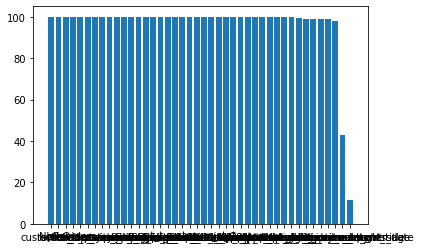

In [49]:
nonNullRate = []
for col in mergedFrame1000.columns: 
    #we are counting the row with data and without Null or NaN over the number of rows
    nonNullRate.append({"columns": col, "type": str(mergedFrame1000[col].dtypes) ,"filledRatio": round((mergedFrame1000[col].count()/mergedFrame1000.shape[0])*100, 3), "nbValues": mergedFrame1000[col].nunique()})
nonNullRateFrame = pd.DataFrame(nonNullRate)    
#Etape de filtre
lessThanOnePercentColumns = nonNullRateFrame[nonNullRateFrame["filledRatio"] < 10]
moreThanOnePercentColumns = nonNullRateFrame[nonNullRateFrame["filledRatio"] >1]

moreThanOnePercentColumns = moreThanOnePercentColumns.sort_values(by=["filledRatio"], ascending=False)
plt.bar(moreThanOnePercentColumns["columns"].values, moreThanOnePercentColumns['filledRatio'].values)
stringColumn = moreThanOnePercentColumns[moreThanOnePercentColumns["type"] == "object"]
intColumn = moreThanOnePercentColumns[moreThanOnePercentColumns["type"] == "int64"]
floatColumn = moreThanOnePercentColumns[moreThanOnePercentColumns["type"] == "float64"]

stringColumn = stringColumn[stringColumn["nbValues"] < 100]
moreThanOnePercentColumns

In [50]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
encoder = LabelEncoder()
newCols = []
for column in stringColumn["columns"].values:
    newCol = column+"Enc"
    print(newCol)
    mergedFrame1000[newCol] = encoder.fit_transform(mergedFrame1000[column].values)
    #mergedFrame1000[newCol].value_counts().plot(kind="bar")
    newCols.append(newCol)
newCols

seller_stateEnc
payment_typeEnc
customer_stateEnc
order_statusEnc
product_category_nameEnc


<ipython-input-50-15065d5df399>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mergedFrame1000[newCol] = encoder.fit_transform(mergedFrame1000[column].values)


['seller_stateEnc',
 'payment_typeEnc',
 'customer_stateEnc',
 'order_statusEnc',
 'product_category_nameEnc']

In [51]:
filterC = newCols + list(intColumn["columns"].values) 
filterC  = filterC + list(floatColumn["columns"].values)
#filterC  = filterC + ["customer_zip_code_prefix"]
print(filterC)
filterC.remove("order_item_id")
toDrop = ["product_weight_g",
 'product_length_cm',
 'product_height_cm',
 'product_width_cm',
 "customer_zip_code_prefix", 
          "freight_value", "payment_value", 
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty', "seller_zip_code_prefix", "seller_stateEnc"]

for drop in toDrop:
    print(drop)
    filterC.remove(drop)
filterC

['seller_stateEnc', 'payment_typeEnc', 'customer_stateEnc', 'order_statusEnc', 'product_category_nameEnc', 'NbReviews', 'nbOrders', 'seller_zip_code_prefix', 'review_score', 'payment_installments', 'payment_sequential', 'customer_zip_code_prefix', 'returningCustomers', 'order_item_id', 'price', 'freight_value', 'payment_value', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'product_description_lenght', 'product_photos_qty', 'product_name_lenght']
product_weight_g
product_length_cm
product_height_cm
product_width_cm
customer_zip_code_prefix
freight_value
payment_value
product_name_lenght
product_description_lenght
product_photos_qty
seller_zip_code_prefix
seller_stateEnc


['payment_typeEnc',
 'customer_stateEnc',
 'order_statusEnc',
 'product_category_nameEnc',
 'NbReviews',
 'nbOrders',
 'review_score',
 'payment_installments',
 'payment_sequential',
 'returningCustomers',
 'price']

In [52]:
X = mergedFrame1000.dropna().filter(items=filterC).values
print(X)
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

[[  1.    18.     2.   ...   1.     0.   116.99]
 [  1.    18.     2.   ...   1.     0.   116.99]
 [  0.     7.     2.   ...   1.     0.   116.99]
 ...
 [  1.    10.     2.   ...   1.     0.    49.9 ]
 [  1.    25.     2.   ...   1.     0.    49.9 ]
 [  1.    17.     2.   ...   1.     0.    15.9 ]]


# PCA 

In [53]:
from sklearn import decomposition
n_components = 6
pca = decomposition.PCA(n_components=n_components)
pca.fit(X_scaled)

PCA(n_components=6)

In [54]:
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.sum())
print("components", pca.components_)

[0.2891747  0.14617385 0.13309931 0.10128481 0.09882102 0.09678719]
0.865340881552865
components [[ 1.30327927e-02  2.42753911e-02  2.22044605e-16  1.40855421e-02
   5.82241362e-01  5.77550094e-01  5.72057528e-02  3.48745608e-03
   5.77314412e-03  5.68377128e-01 -1.01383158e-02]
 [ 7.06735904e-01 -1.82020436e-02 -1.38777878e-17 -7.88319807e-03
  -6.26004429e-03 -1.18743698e-02  7.40421327e-03  7.52722914e-03
   7.05339805e-01 -3.85033235e-03  4.81681151e-02]
 [ 5.09958576e-02 -2.18125613e-01 -1.11022302e-16  1.42489042e-01
   9.76403870e-03  1.19828059e-02 -1.43565015e-01  6.86906102e-01
  -1.05197334e-01  5.37901106e-03  6.52481623e-01]
 [ 2.81581888e-02  5.58993757e-01 -5.55111512e-17 -5.84938150e-01
  -1.97928878e-02 -2.32946229e-02  5.06877101e-01  1.78915902e-01
  -4.38609548e-02 -1.36553359e-02  2.29348016e-01]
 [-1.30235083e-02  5.40682824e-02  3.53883589e-16  6.87939279e-01
  -2.77053891e-02 -2.90763349e-02  7.11166148e-01 -7.02647775e-02
   7.56842382e-03 -3.05406333e-02  1.01

### Données projetées sur les composantes principales et colorée par classement state.

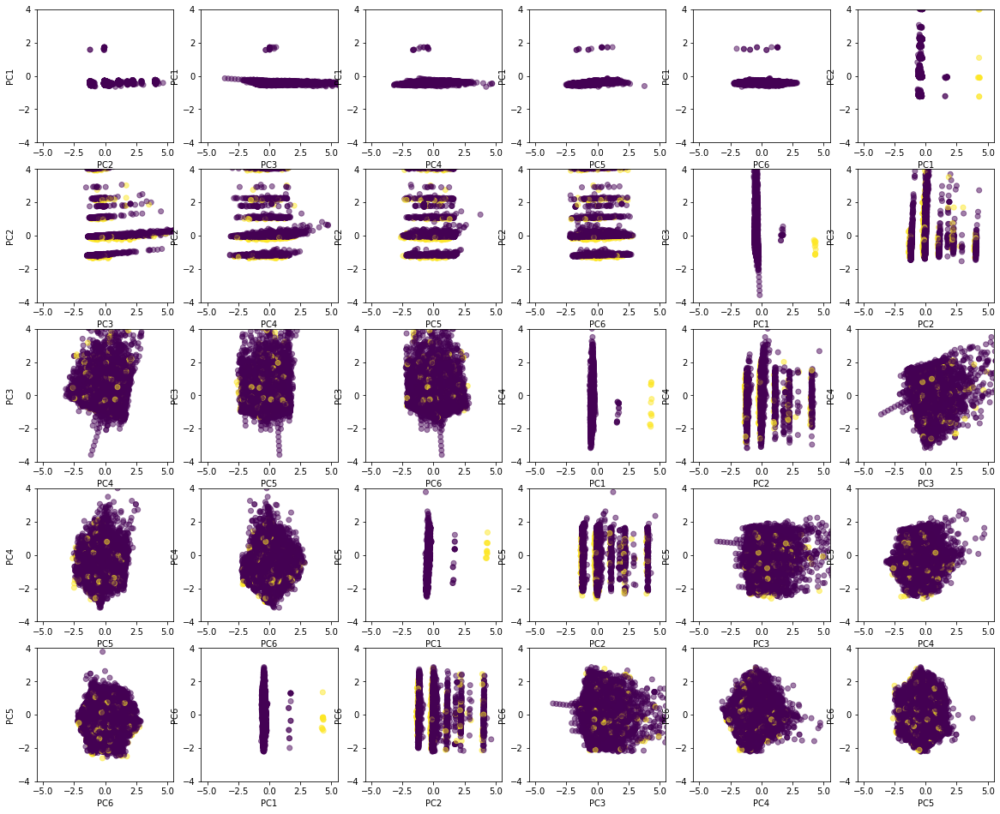

In [55]:
scatter = plt.figure(figsize=(20,20))
subplotIndex = 1
for c in range(n_components):

    # projeter X sur les composantes principales
    X_projected = pca.transform(X_scaled)
    #ax = scatter.add_subplot(4, 3, (c+1))
    dimension = 'PC'+str(c+1)
    #print(dimension)
    # afficher chaque observation
    for cX in range(n_components):
        if cX != c:
            ax = scatter.add_subplot(n_components, n_components, subplotIndex)
            dimensionX = 'PC'+str(cX+1)
            ax.scatter(X_projected[:, cX], X_projected[:, c],  alpha=0.5, marker="o",
                # colorer en utilisant la variable 'Review Score
                c=mergedFrame1000.dropna().get('returningCustomers'))
            ax.set_ylabel(dimension)
            ax.set_xlabel(dimensionX)
            ax.set_xlim([-5.5, 5.5])
            ax.set_ylim([-4, 4])
            subplotIndex = subplotIndex+1
    #ax.xlim([-5.5, 5.5])
    #ax.ylim([-4, 4])
    #ax.colorbar()
    #ax.show()

### Contribution de chaque variable aux composantes principales

(-0.7, 0.7)

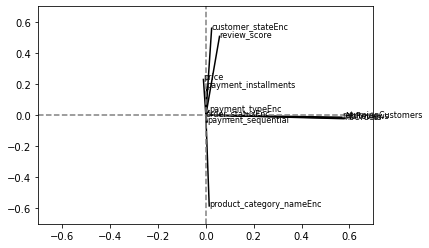

In [56]:
pcs = pca.components_

for i, (x, y) in enumerate(zip(pcs[0, :], pcs[3, :])):
    # Afficher un segment de l'origine au point (x, y)
    plt.plot([0, x], [0, y], color='k')
    # Afficher le nom (data.columns[i]) de la performance
    plt.text(x, y, mergedFrame1000.filter(items=filterC).columns[i], fontsize='8')

# Afficher une ligne horizontale y=0
plt.plot([-0.7, 0.7], [0, 0], color='grey', ls='--')

# Afficher une ligne verticale x=0
plt.plot([0, 0], [-0.7, 0.7], color='grey', ls='--')

plt.xlim([-0.7, 0.7])
plt.ylim([-0.7, 0.7])

# NMF 
### Only Positive Value

# Data Adjustment

In [57]:
filterC = newCols + list(intColumn["columns"].values)
filterC  = filterC + list(floatColumn["columns"].values)
#filterC  = filterC + ["customer_zip_code_prefix"]
filterC.remove("order_item_id")
toDrop = ["product_weight_g",
 'product_length_cm',
 'product_height_cm',
        "review_score",   
 'product_width_cm',
 "customer_zip_code_prefix", 
          "freight_value", "payment_value", 
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty', "seller_zip_code_prefix", "seller_stateEnc"]

for drop in toDrop:
    filterC.remove(drop)
filterC

['payment_typeEnc',
 'customer_stateEnc',
 'order_statusEnc',
 'product_category_nameEnc',
 'NbReviews',
 'nbOrders',
 'payment_installments',
 'payment_sequential',
 'returningCustomers',
 'price']

In [58]:
from sklearn import decomposition
minMaxEncoder = preprocessing.MinMaxScaler()
X_MinMax = minMaxEncoder.fit_transform(mergedFrame1000.dropna().filter(items=filterC).values)
nmf = decomposition.NMF(n_components=n_components, max_iter=10000)
nmf.fit(X_MinMax)

#print(nmf.explained_variance_ratio_)
#print(nmf.explained_variance_ratio_.sum())
print("components", nmf.components_)

/Users/benjamindeplus/.local/share/virtualenvs/Olist-EdoNLiO1/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


components [[9.64226981e-03 8.93859401e+00 0.00000000e+00 1.56896364e-01
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  1.44664223e-05 5.67291327e-03]
 [6.71847651e-03 0.00000000e+00 0.00000000e+00 8.54985378e+00
  0.00000000e+00 1.42415447e-03 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [6.64494363e-04 0.00000000e+00 0.00000000e+00 1.13578744e-02
  1.35951676e+00 1.34264559e+00 0.00000000e+00 0.00000000e+00
  4.64854438e+00 0.00000000e+00]
 [7.30022842e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 3.21251289e-01
  3.87251562e-03 1.84942497e-02]
 [2.08582679e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 4.87393069e+00 0.00000000e+00
  0.00000000e+00 1.63645983e-02]
 [0.00000000e+00 5.32609832e-01 0.00000000e+00 0.00000000e+00
  1.35018967e-02 1.97811402e-02 0.00000000e+00 0.00000000e+00
  0.00000000e+00 2.20638706e+00]]


### Données projetées sur les composantes principales et colorée par classement state.

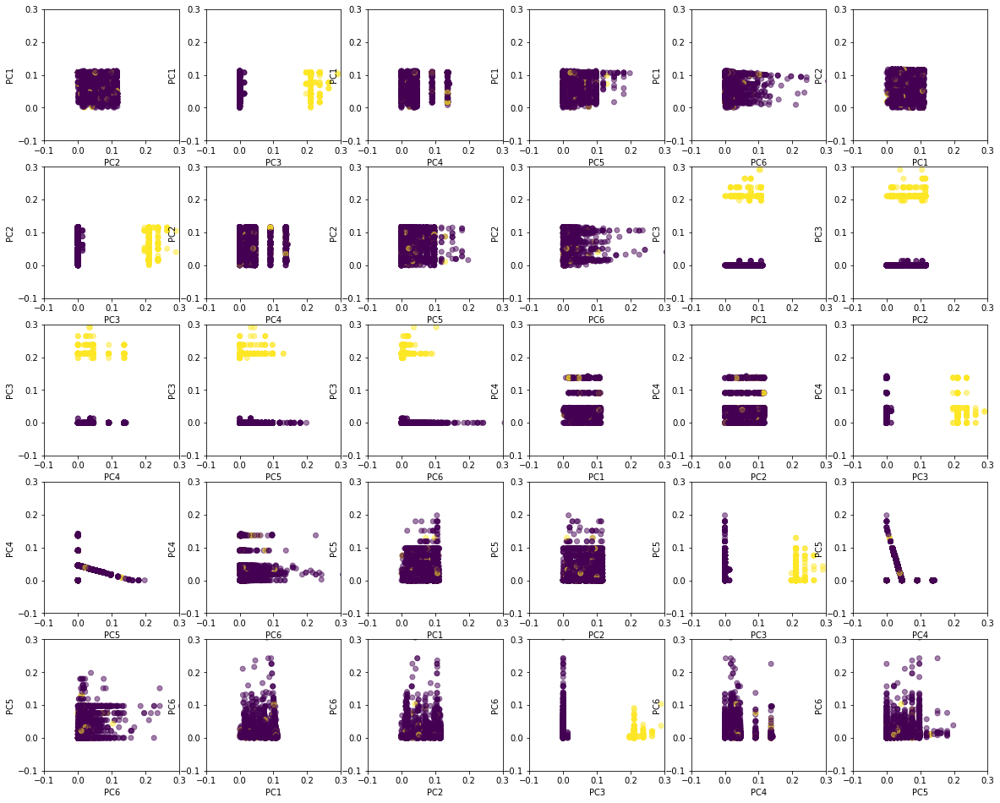

In [60]:
scatter = plt.figure(figsize=(20,20))
subplotIndex = 1
for c in range(n_components):

    # projeter X sur les composantes principales
    X_projected = nmf.transform(X_MinMax)
    #ax = scatter.add_subplot(4, 3, (c+1))
    dimension = 'PC'+str(c+1)
    #print(dimension)
    # afficher chaque observation
    for cX in range(n_components):
        if cX != c:
            ax = scatter.add_subplot(n_components, n_components, subplotIndex)
            dimensionX = 'PC'+str(cX+1)
            ax.scatter(X_projected[:, cX], X_projected[:, c],  alpha=0.5, marker="o",
                # colorer en utilisant la variable 'Review Score
                c=mergedFrame1000.dropna().get('returningCustomers'))
            ax.set_ylabel(dimension)
            ax.set_xlabel(dimensionX)
            ax.set_xlim([-0.1, 0.3])
            ax.set_ylim([-0.1, 0.3])
            subplotIndex = subplotIndex+1
    #ax.xlim([-5.5, 5.5])
    #ax.ylim([-4, 4])
    #ax.colorbar()
    #ax.show()

# Contribution de chaque variable aux composantes principales

(-0.7, 0.7)

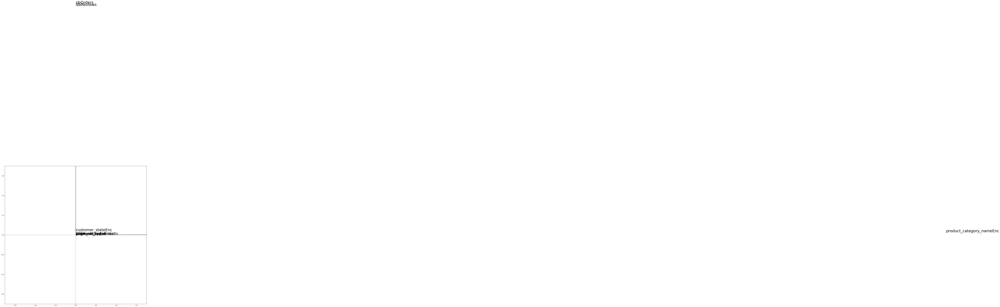

In [27]:
nmfs = nmf.components_
contribution = plt.figure(figsize=(20,20))

for i, (x, y) in enumerate(zip(nmfs[1, :], nmfs[4, :])):
    # Afficher un segment de l'origine au point (x, y)
    plt.plot([0, x], [0, y], color='k')
    # Afficher le nom (data.columns[i]) de la performance
    plt.text(x, y, mergedFrame1000.filter(items=filterC).columns[i], fontsize='30')

# Afficher une ligne horizontale y=0
plt.plot([-0.7, 0.7], [0, 0], color='grey', ls='--')

# Afficher une ligne verticale x=0
plt.plot([0, 0], [-0.7, 0.7], color='grey', ls='--')

plt.xlim([-0.7, 0.7])
plt.ylim([-0.7, 0.7])

# FactorAnalysis 


In [62]:

from sklearn import decomposition
minMaxEncoder = preprocessing.MinMaxScaler()
X_MinMax = minMaxEncoder.fit_transform(mergedFrame1000.dropna().filter(items=filterC).values)
#print(X_MinMax.shape)
factor = decomposition.FactorAnalysis(n_components=n_components, max_iter=10000)
factor.fit(X_scaled)

#print(factor.explained_variance_ratio_)
#print(factor.explained_variance_ratio_.sum())
print("components", factor.components_)

components [[ 1.18860159e-02  2.49166348e-02 -1.28147185e-21  1.78420227e-02
   9.93399036e-01  9.86781833e-01  6.33795460e-02  7.48890528e-03
   3.08235108e-03  9.37861996e-01 -1.00071122e-02]
 [ 7.01223228e-01 -5.04169922e-03  2.04374336e-22 -5.95197400e-03
   2.73448247e-03 -7.63629776e-03  6.56290668e-03 -1.48117232e-02
   7.11779012e-01  1.07752865e-02  2.10459900e-02]
 [ 9.99538192e-02 -8.43484818e-02 -8.01006083e-23  4.83529784e-02
  -9.84836925e-04  4.03955748e-03 -6.03003369e-02  6.54017380e-01
  -9.41915706e-02 -9.53454635e-03  5.20895013e-01]
 [ 3.10577680e-03 -3.60977627e-02  3.19151369e-22  1.77236127e-02
  -1.32515475e-02  7.11118878e-02 -1.91425221e-02 -3.10200154e-02
   3.18575238e-02 -1.98641826e-01 -3.11654657e-04]
 [-1.67921693e-01 -2.57847100e-02  6.93887947e-23  3.52820278e-02
   3.81492165e-03 -5.66422785e-03  4.57695296e-02 -1.54234964e-01
   1.51077616e-01 -1.74834628e-03  3.05827134e-01]
 [-5.88687192e-02 -1.39216533e-01  7.37816401e-23  4.24231920e-02
  -1.694

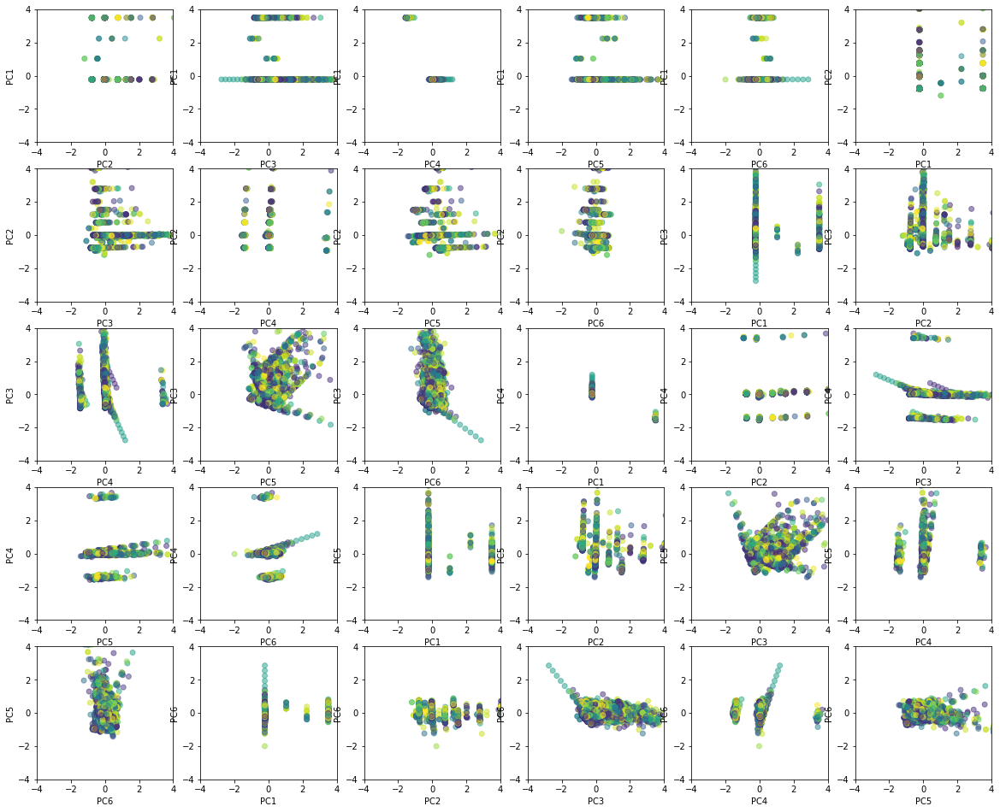

In [65]:
scatter = plt.figure(figsize=(20,20))
subplotIndex = 1
for c in range(n_components):

    # projeter X sur les composantes principales
    X_projected = factor.transform(X_scaled)
    #ax = scatter.add_subplot(4, 3, (c+1))
    dimension = 'PC'+str(c+1)
    #print(dimension)
    # afficher chaque observation
    for cX in range(n_components):
        if cX != c:
            ax = scatter.add_subplot(n_components, n_components, subplotIndex)
            dimensionX = 'PC'+str(cX+1)
            ax.scatter(X_projected[:, cX], X_projected[:, c],  alpha=0.5, marker="o",
                # colorer en utilisant la variable 'Review Score
                c=mergedFrame1000.dropna().get('product_category_nameEnc'))
                #c=mergedFrame1000.dropna().get('returningCustomers'))
            ax.set_ylabel(dimension)
            ax.set_xlabel(dimensionX)
            ax.set_xlim([-4, 4])
            ax.set_ylim([-4, 4])
            subplotIndex = subplotIndex+1
    #ax.xlim([-5.5, 5.5])
    #ax.ylim([-4, 4])
    #ax.colorbar()
    #ax.show()

# Kernel PCA 

In [30]:
from sklearn.decomposition import KernelPCA
kpca = KernelPCA(n_components=n_components, kernel='rbf', gamma=10).fit(X_scaled)

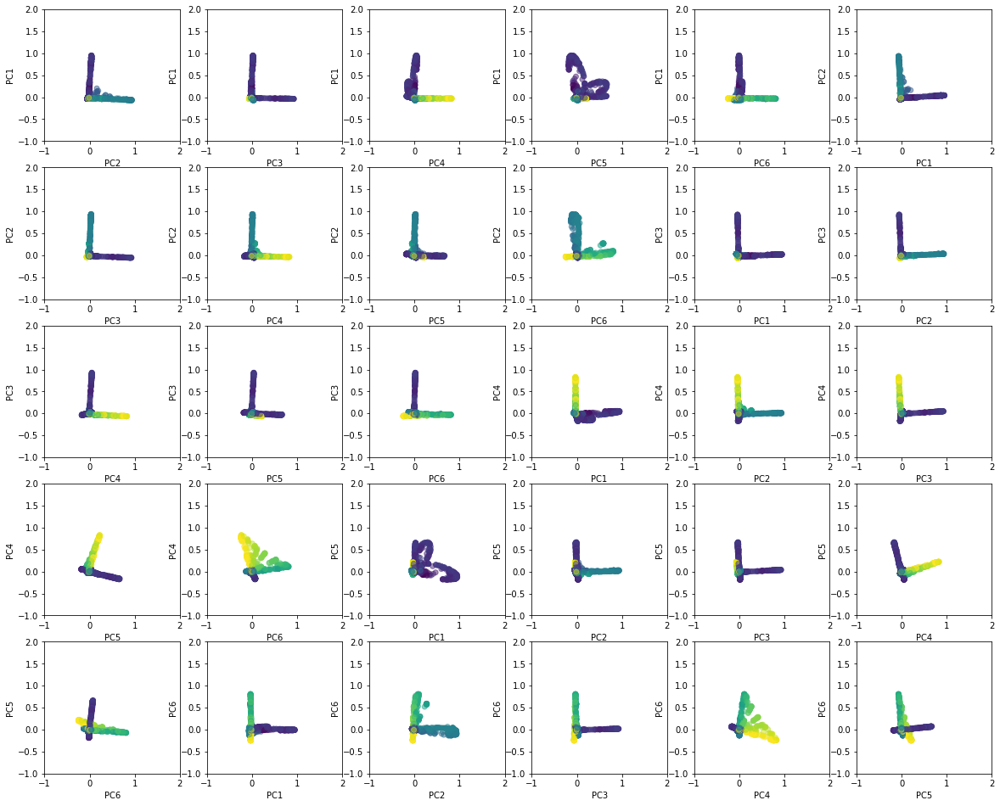

In [69]:
scatter = plt.figure(figsize=(20,20))
subplotIndex = 1
for c in range(n_components):

    # projeter X sur les composantes principales
    X_projected = kpca.transform(X_scaled)
    #ax = scatter.add_subplot(4, 3, (c+1))
    dimension = 'PC'+str(c+1)
    #print(dimension)
    # afficher chaque observation
    for cX in range(n_components):
        if cX != c:
            ax = scatter.add_subplot(n_components, n_components, subplotIndex)
            dimensionX = 'PC'+str(cX+1)
            ax.scatter(X_projected[:, cX], X_projected[:, c],  alpha=0.5, marker="o",
                # colorer en utilisant la variable 'Review Score
                c=mergedFrame1000.dropna().get('product_category_nameEnc'))
            ax.set_ylabel(dimension)
            ax.set_xlabel(dimensionX)
            ax.set_xlim([-1, 2])
            ax.set_ylim([-1, 2])
            subplotIndex = subplotIndex+1
    #ax.xlim([-5.5, 5.5])
    #ax.ylim([-4, 4])
    #ax.colorbar()
    #ax.show()

# TSNE 

Need to be fed with PCA components. 

product_weight_g
product_length_cm
product_height_cm
product_width_cm
customer_zip_code_prefix
freight_value
payment_value
product_name_lenght
product_description_lenght
product_photos_qty
seller_zip_code_prefix
seller_stateEnc
['payment_typeEnc', 'customer_stateEnc', 'order_statusEnc', 'product_category_nameEnc', 'NbReviews', 'nbOrders', 'review_score', 'payment_installments', 'payment_sequential', 'returningCustomers', 'price']
columns Index(['review_score', 'payment_installments', 'payment_sequential', 'price'], dtype='object')
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.109s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000

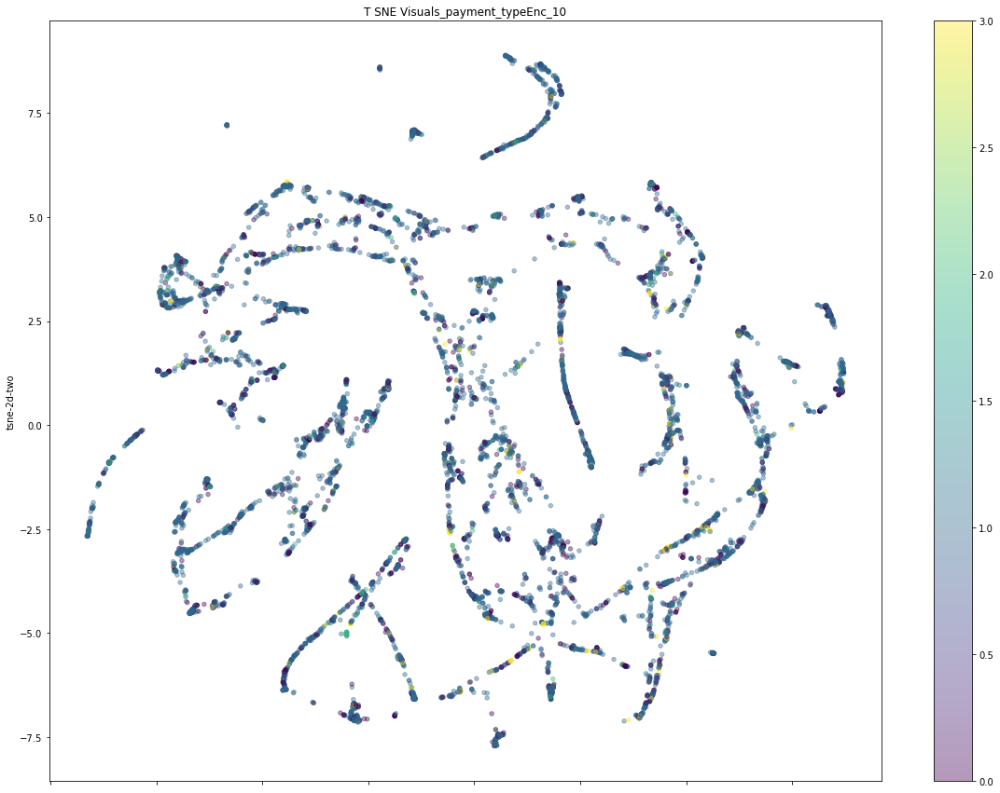

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.153s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.522568
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

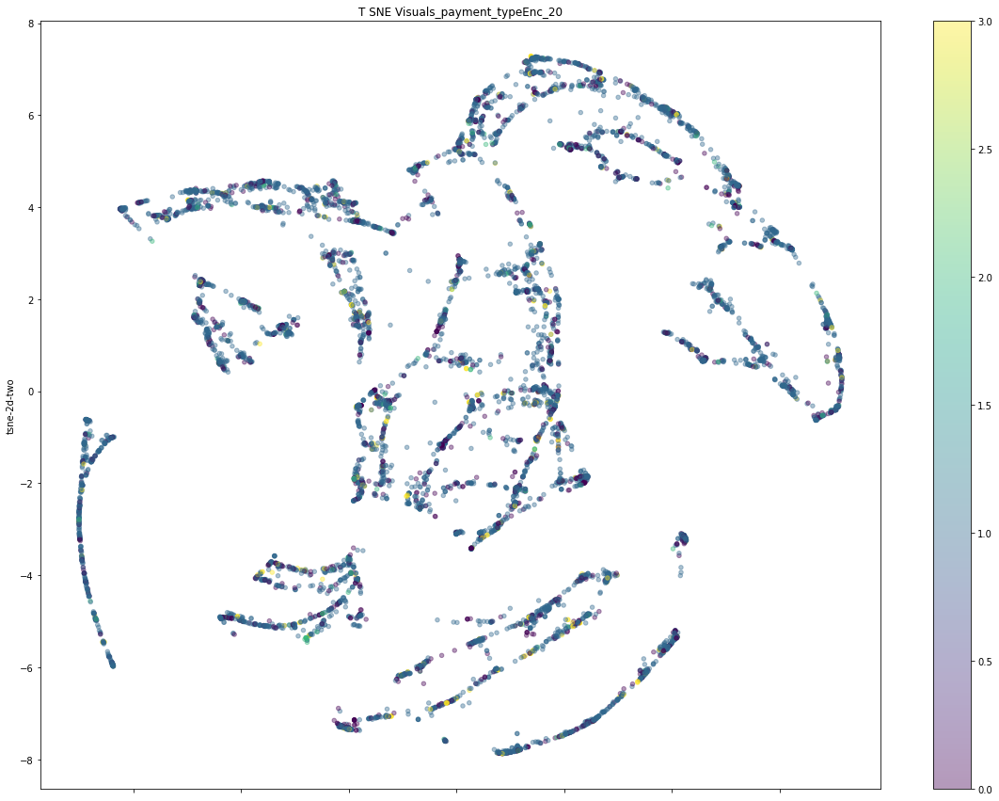

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.682419
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

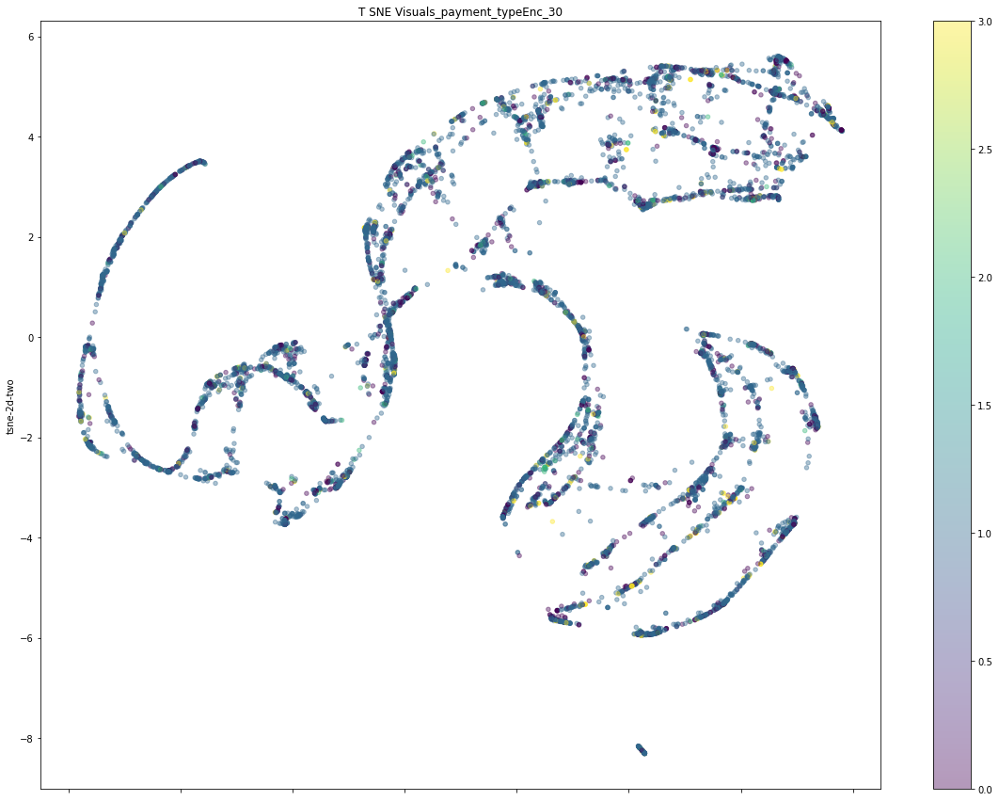

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.006s...
[t-SNE] Computed neighbors for 9494 samples in 0.271s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.181458
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

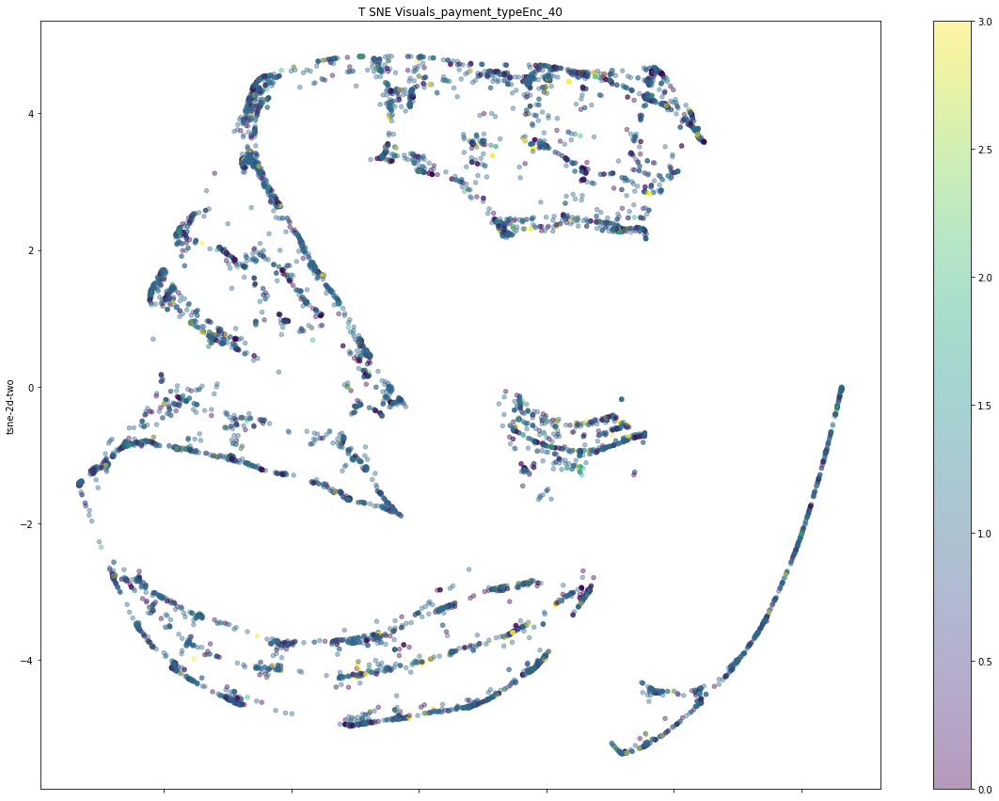

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.006s...
[t-SNE] Computed neighbors for 9494 samples in 0.105s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.526054
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

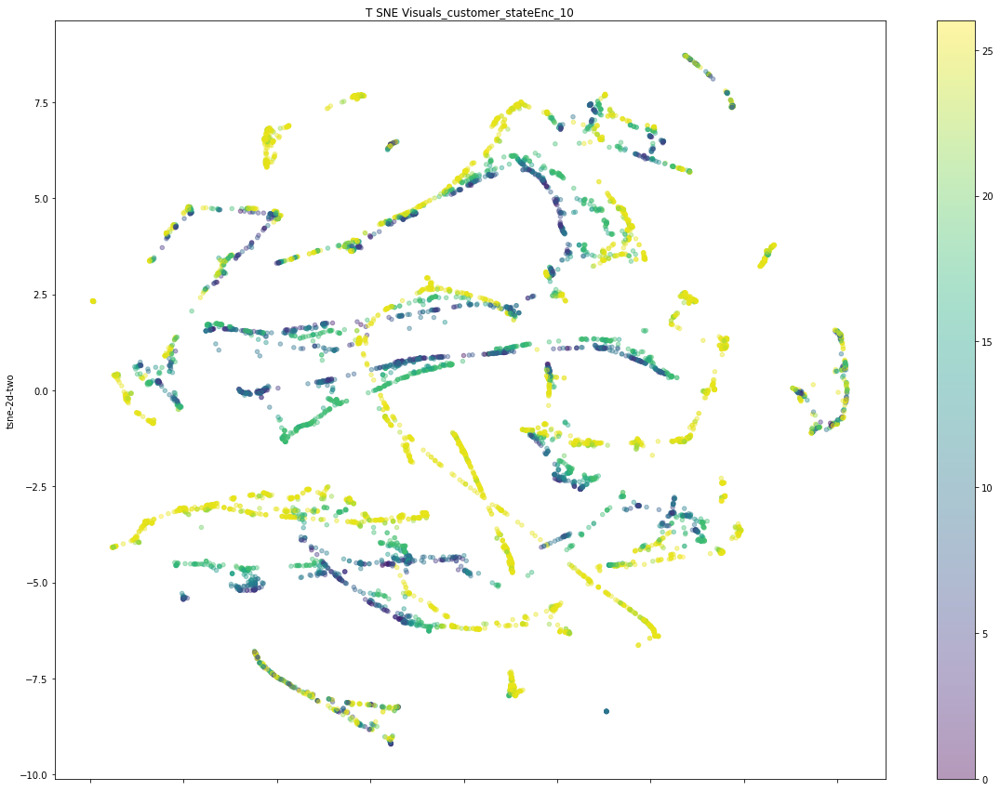

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.170s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.702171
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

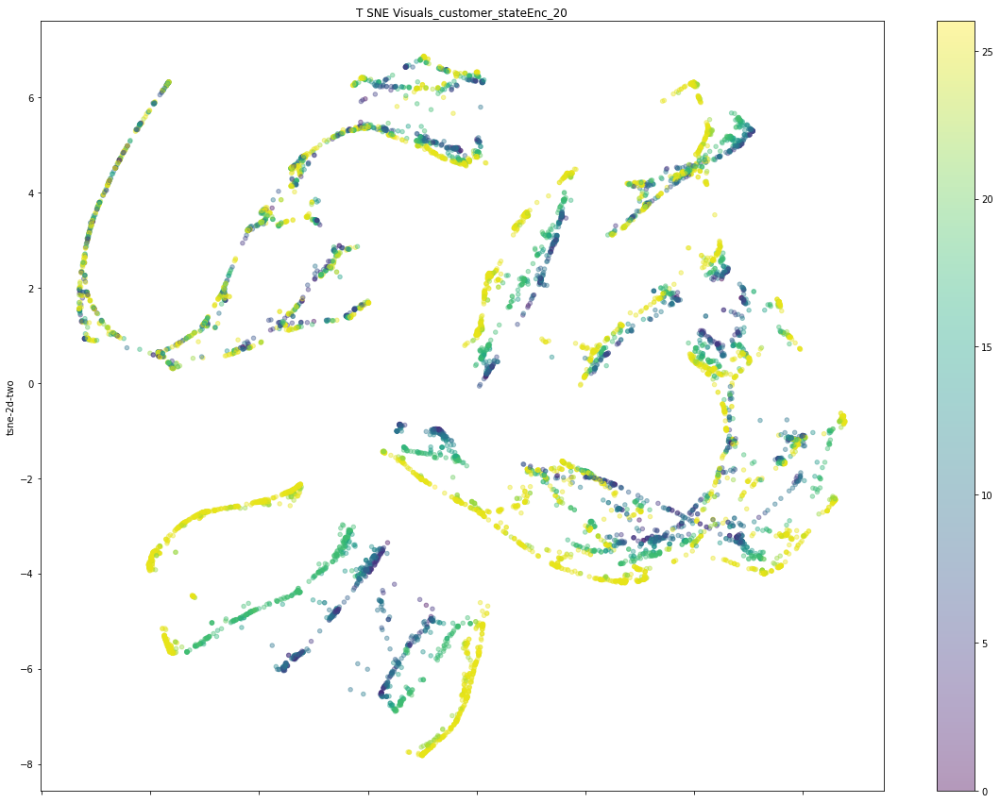

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.233s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.906647
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

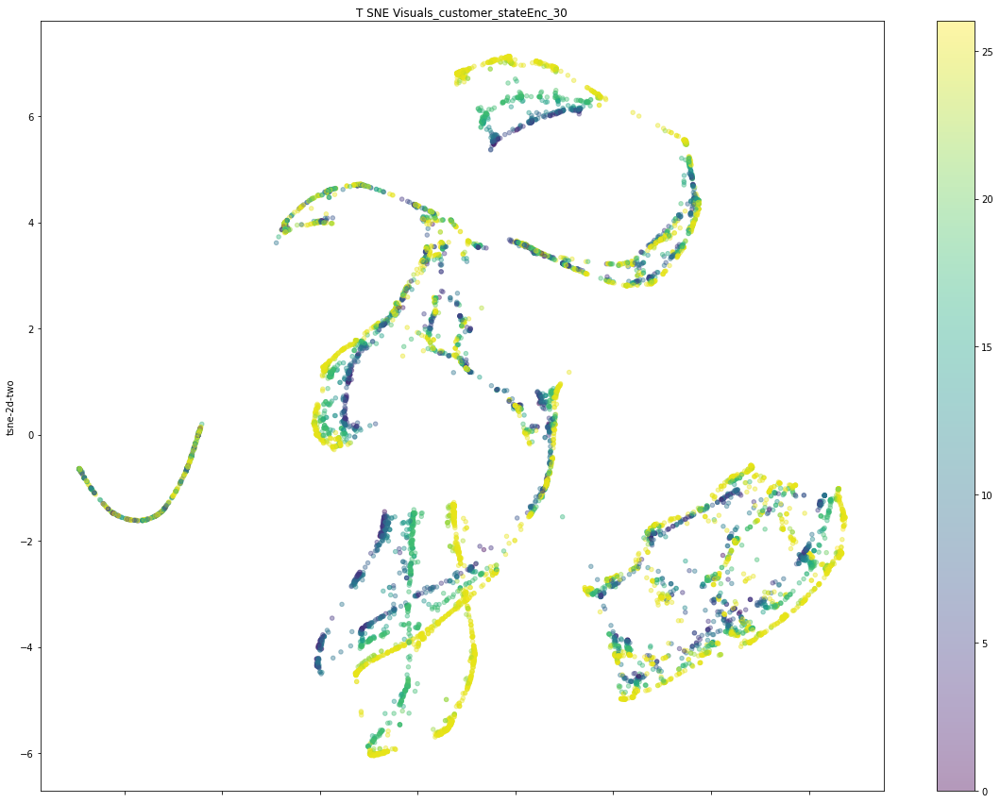

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.287s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.886124
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

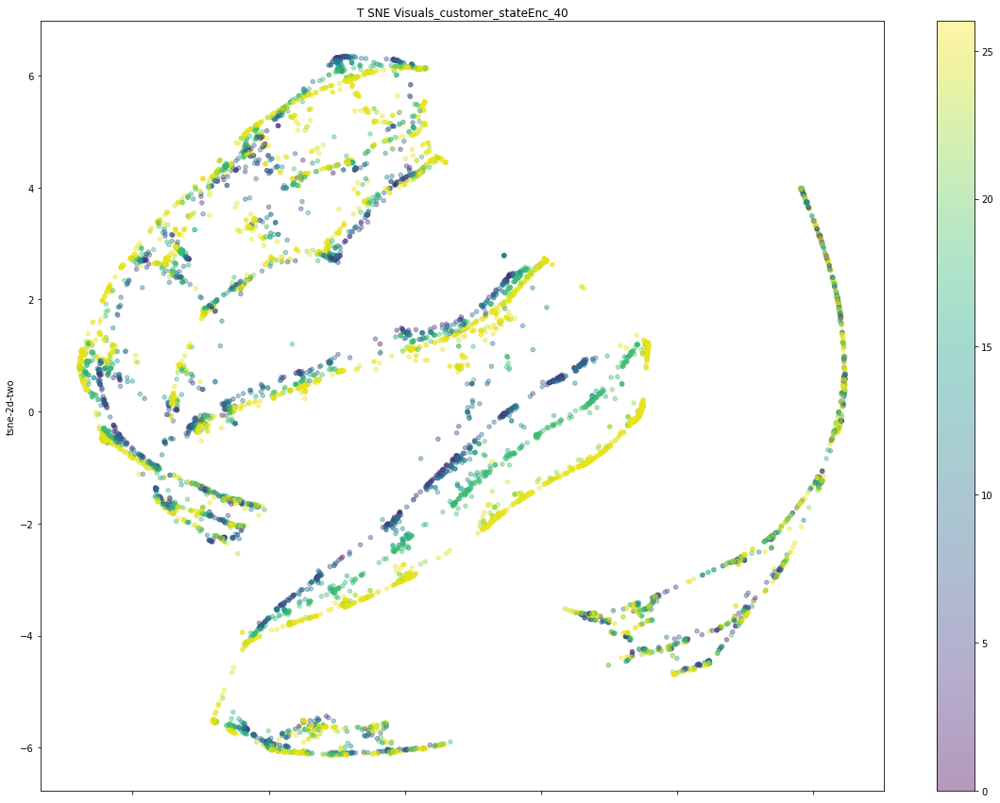

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.112s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.989571
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

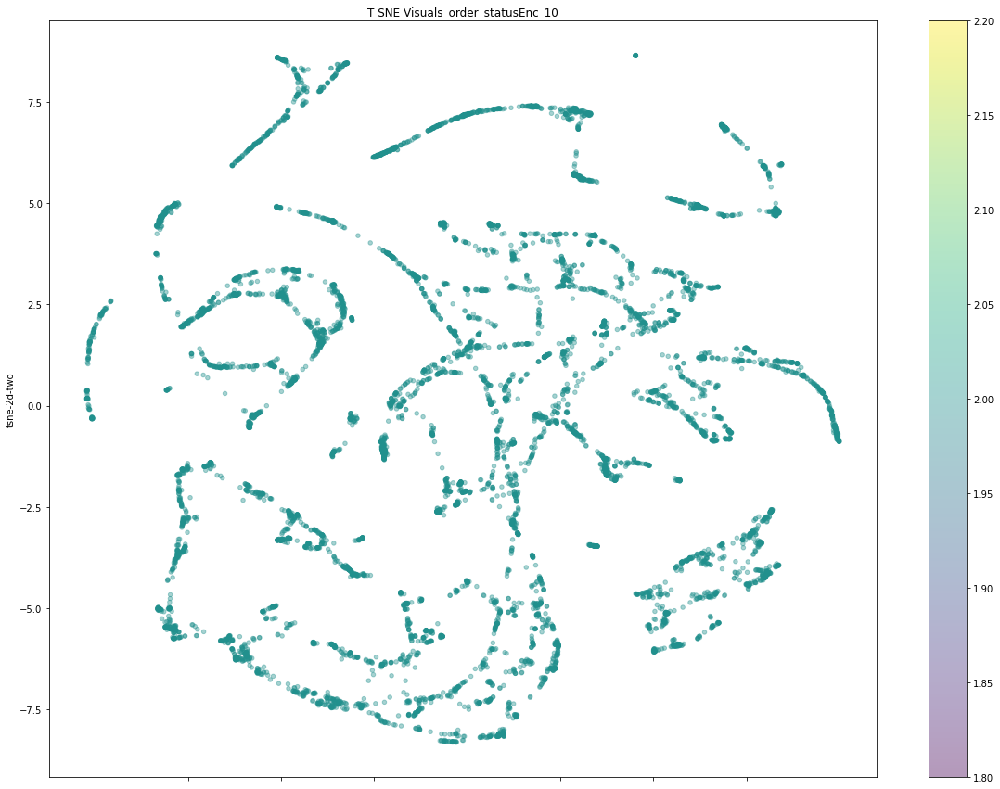

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.165s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.769150
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

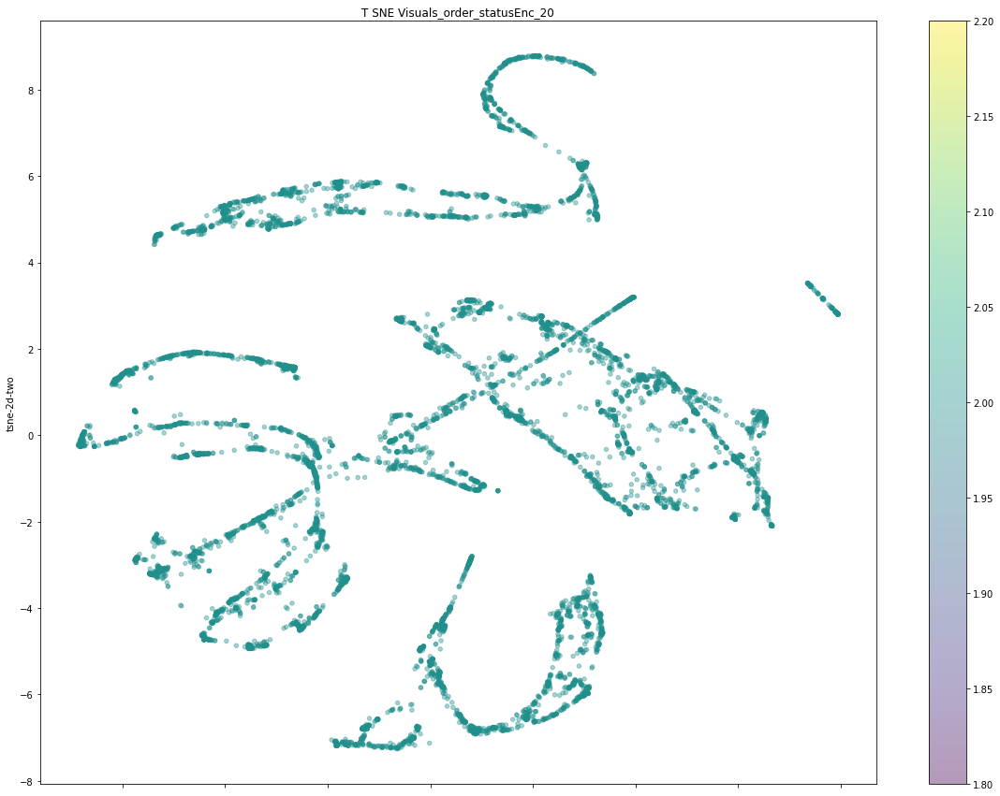

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.704010
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

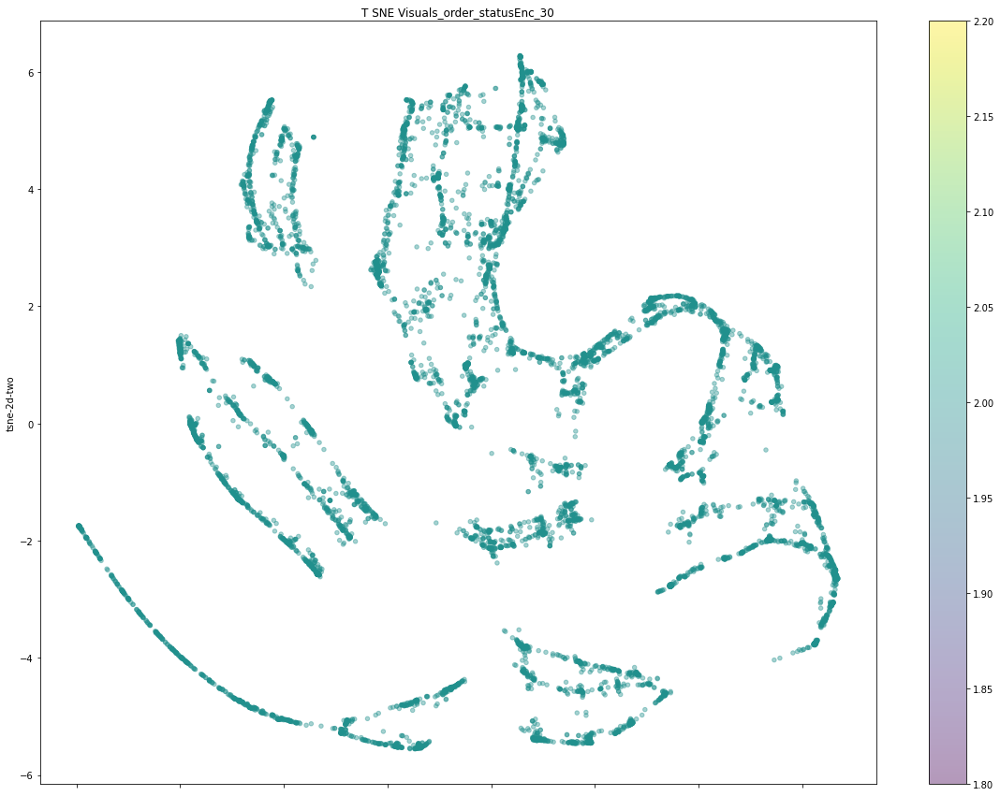

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.265s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.224472
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

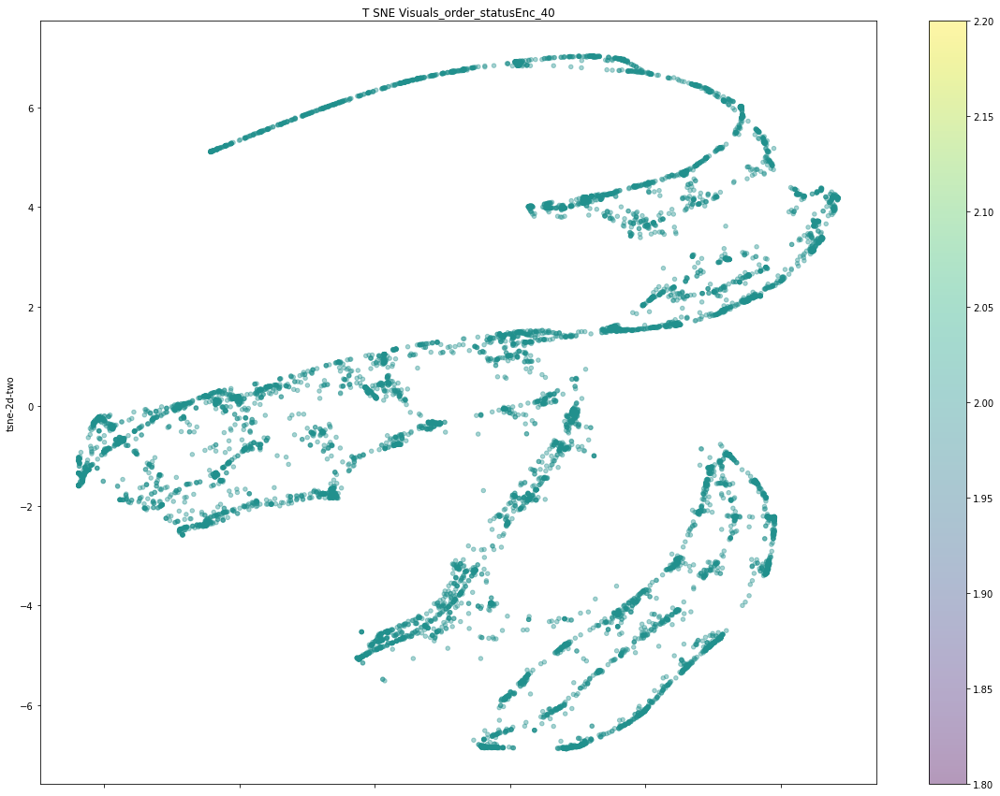

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.107s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.251190
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

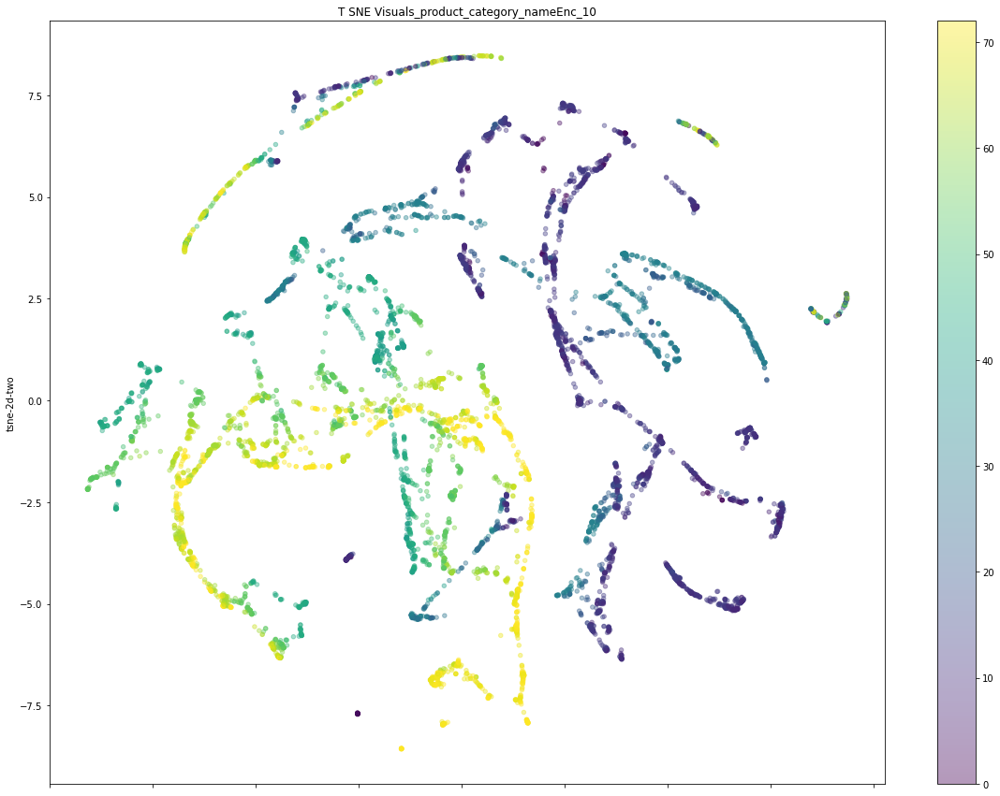

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.164s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.570992
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

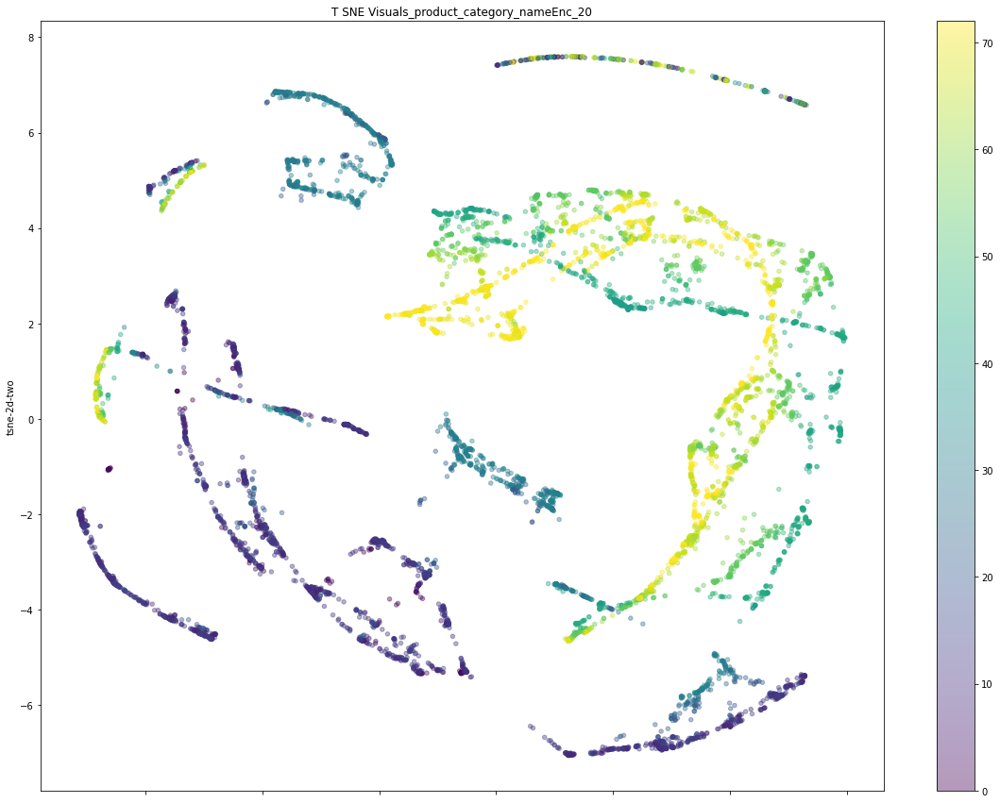

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.214s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.909157
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

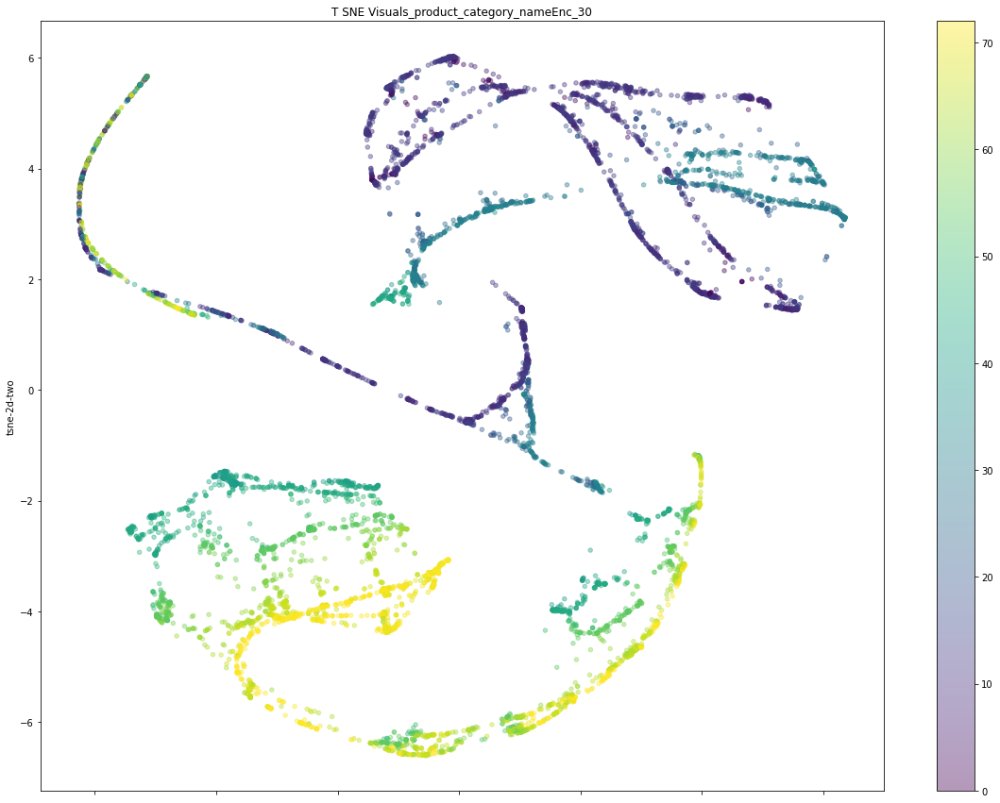

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.267s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.521652
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

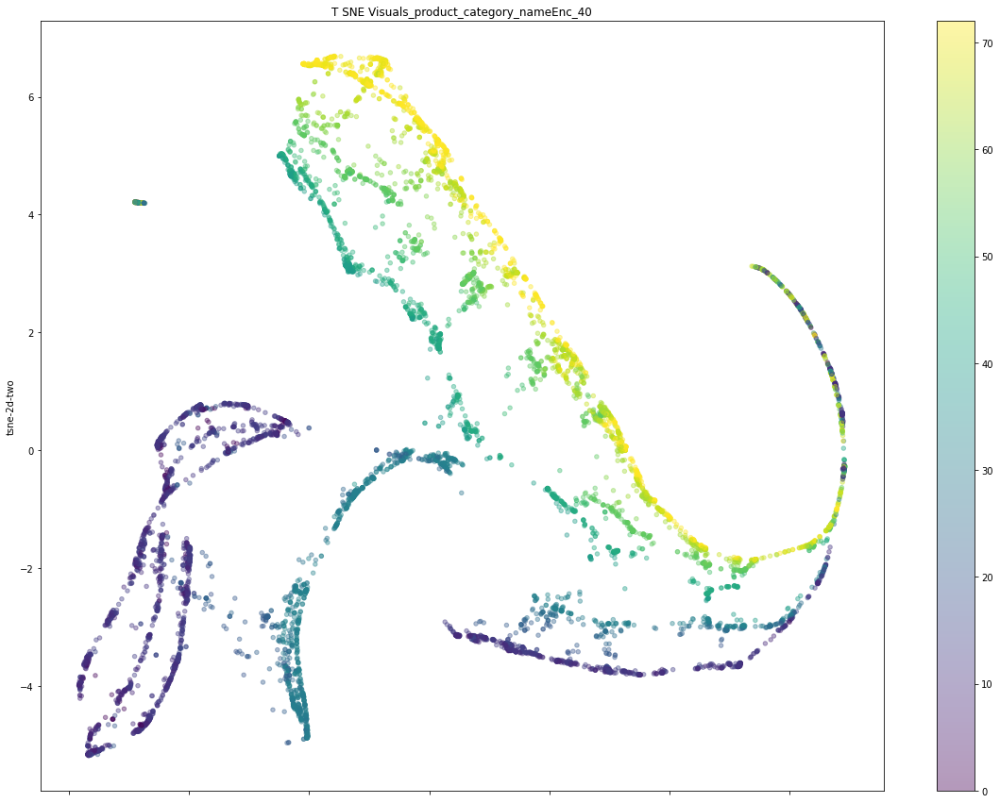

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.107s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.501343
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

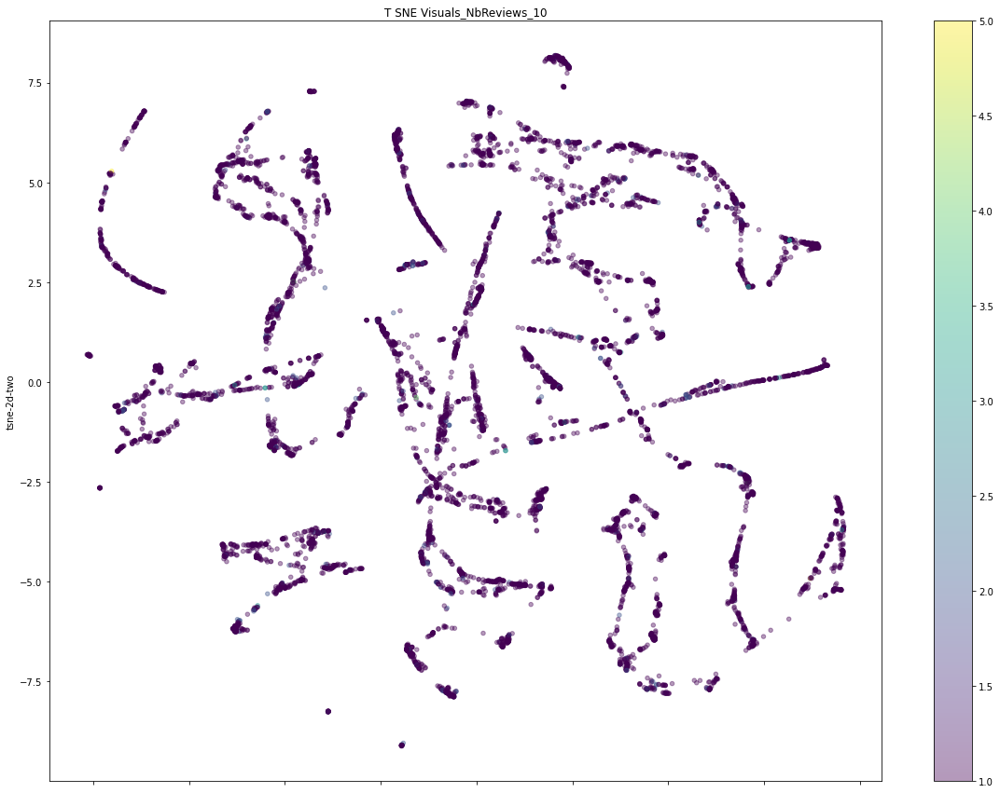

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.163s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.058617
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

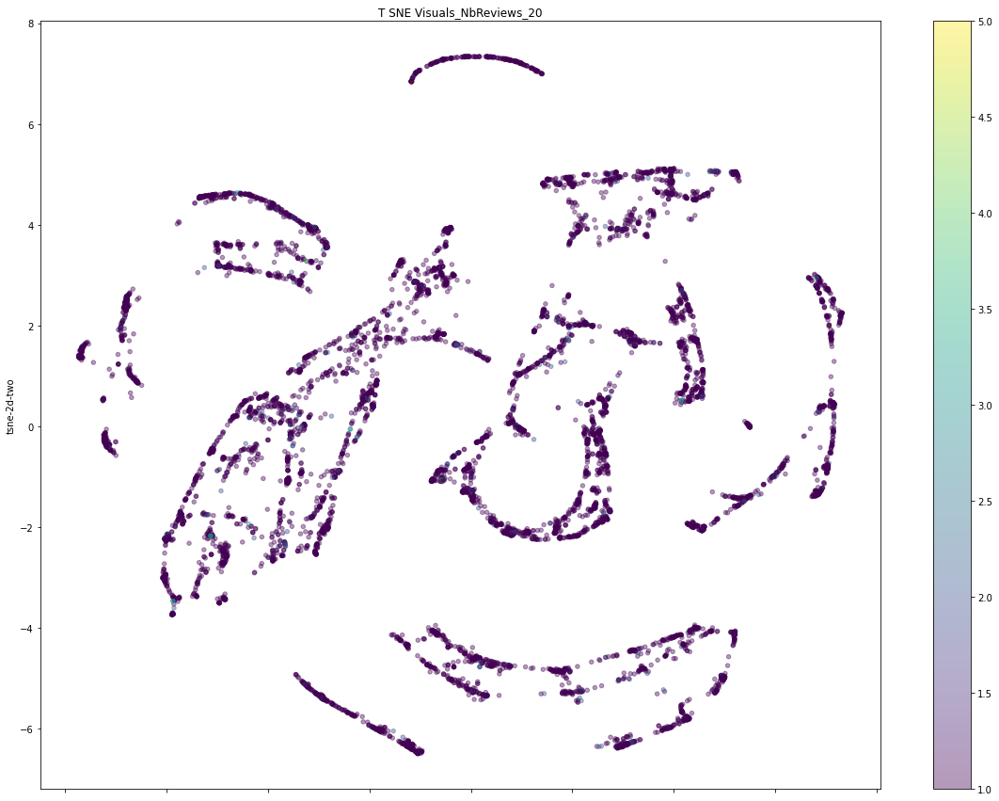

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.223s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.545097
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

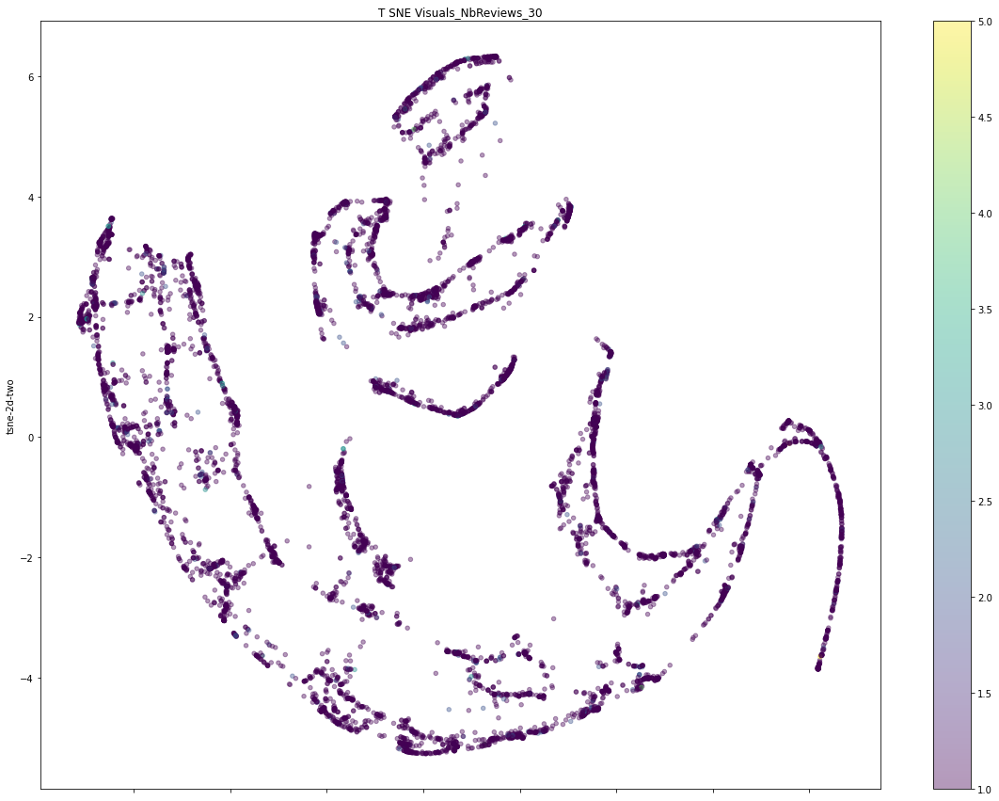

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.302s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.484818
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

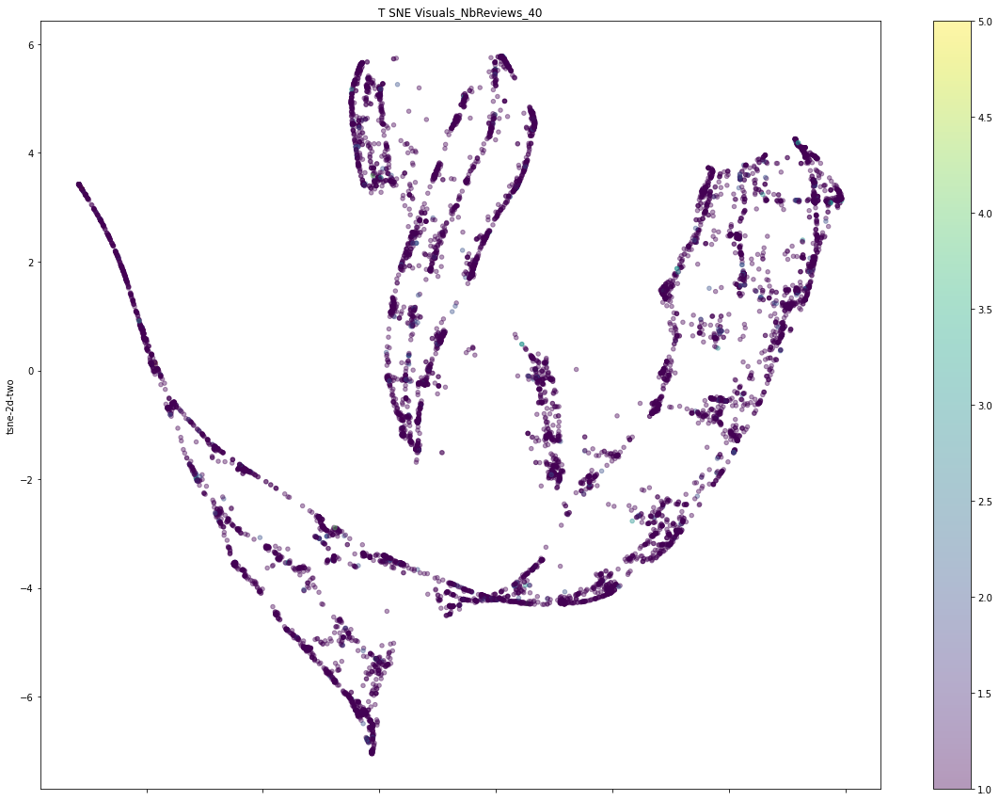

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.119s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.179184
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

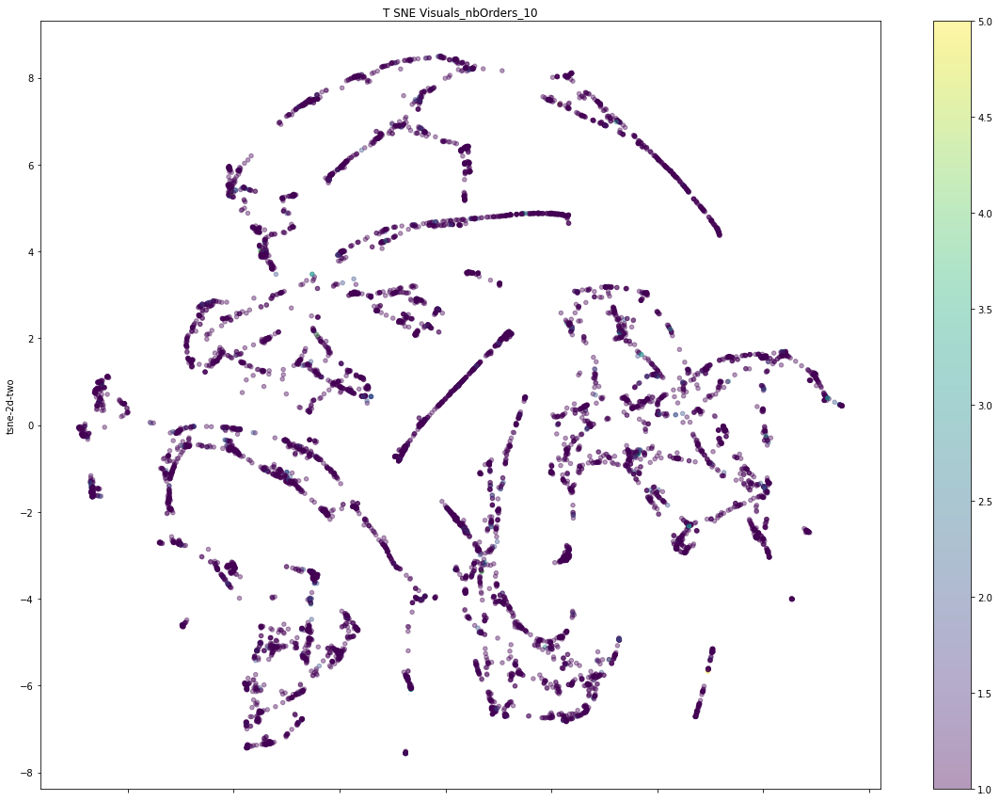

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.182s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.925446
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

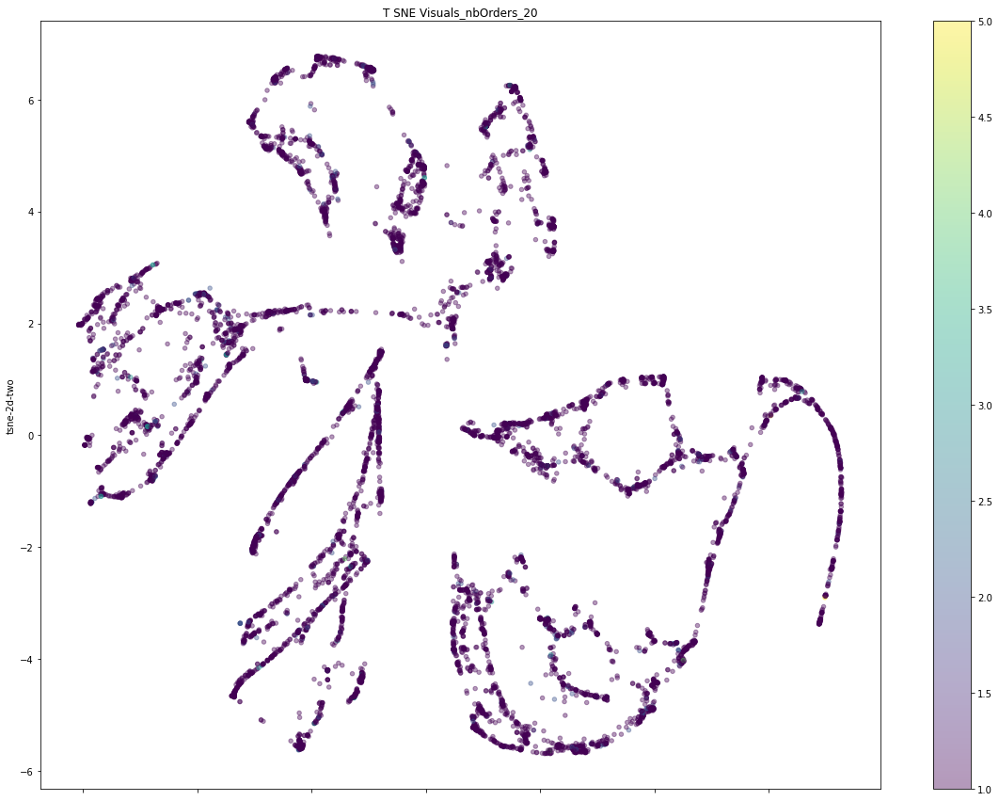

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.242s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.790009
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

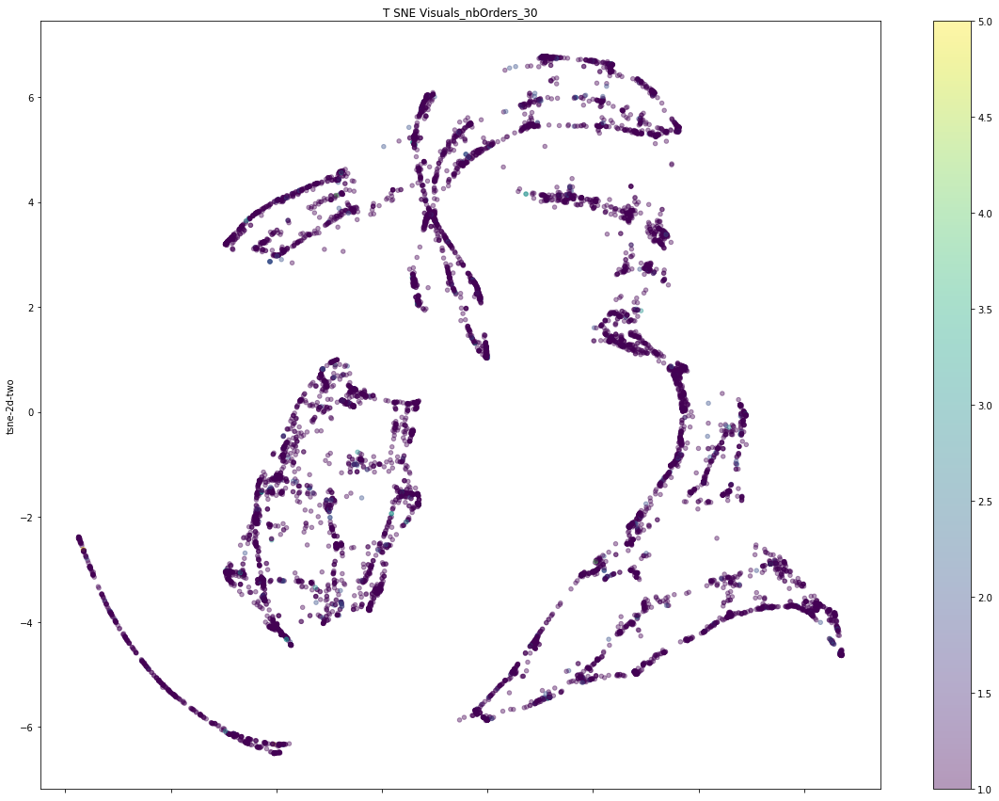

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.300s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.477043
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

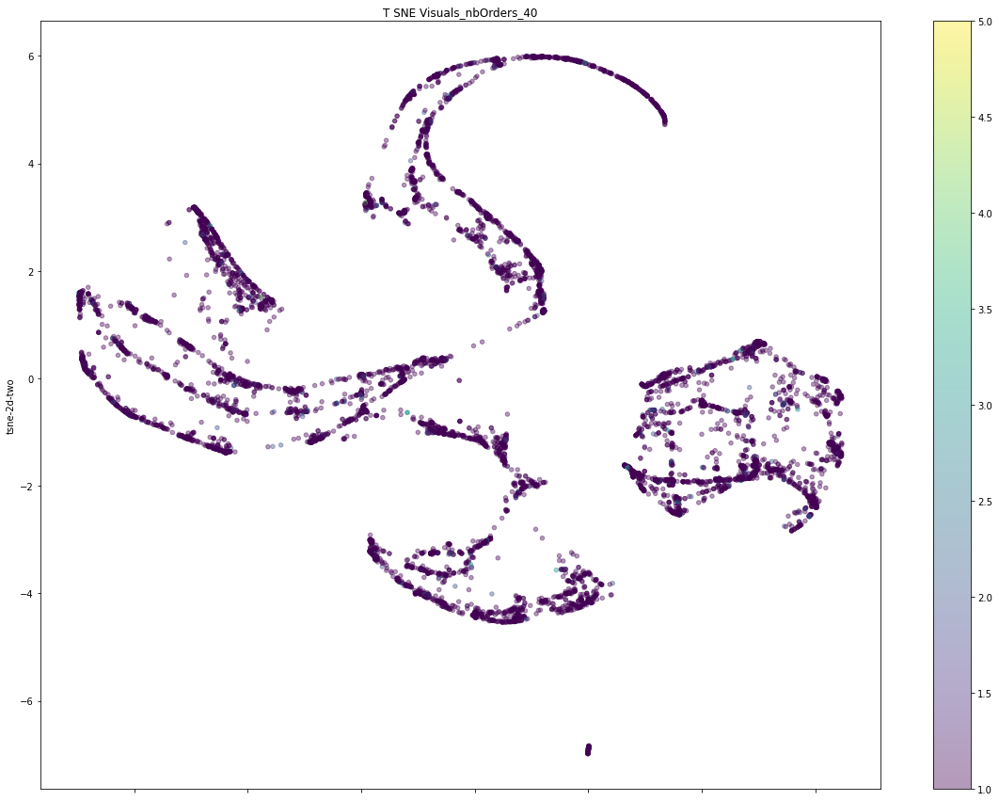

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.006s...
[t-SNE] Computed neighbors for 9494 samples in 0.116s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.144196
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

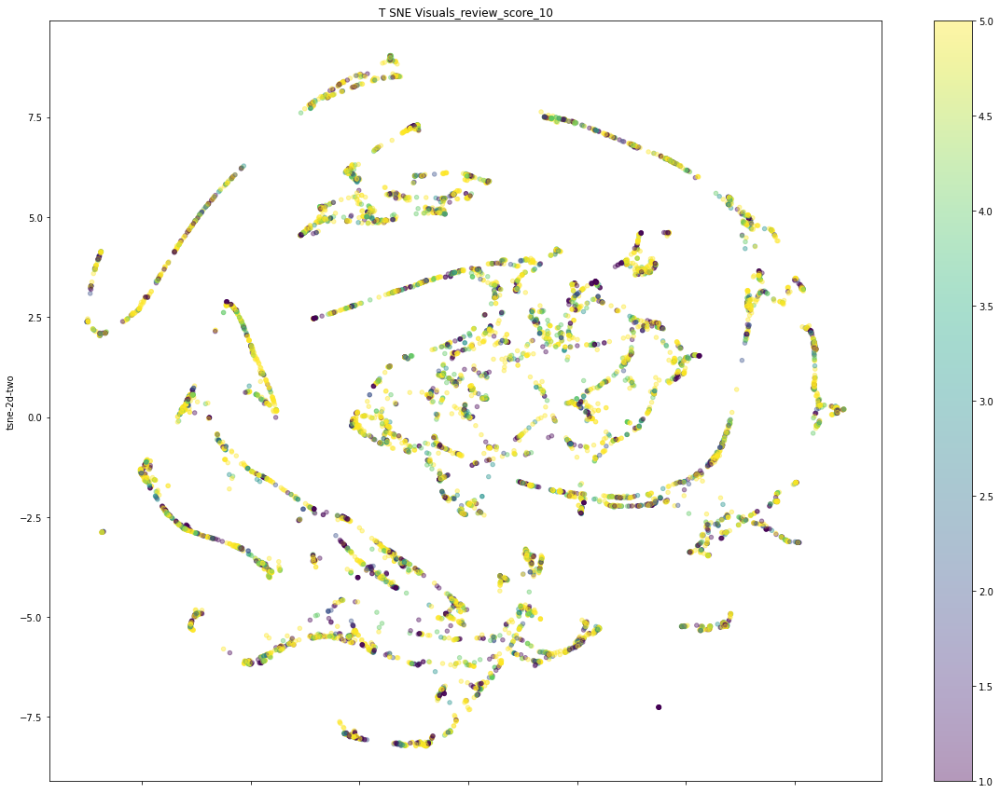

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.180s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.992615
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

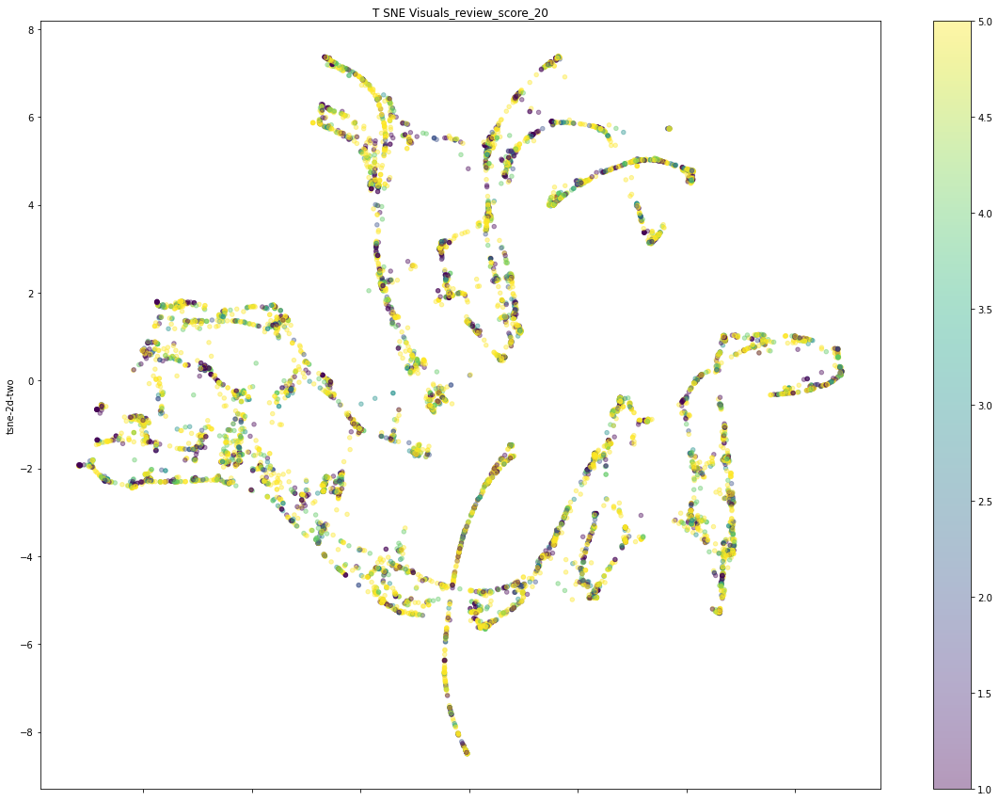

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.242s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.548225
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

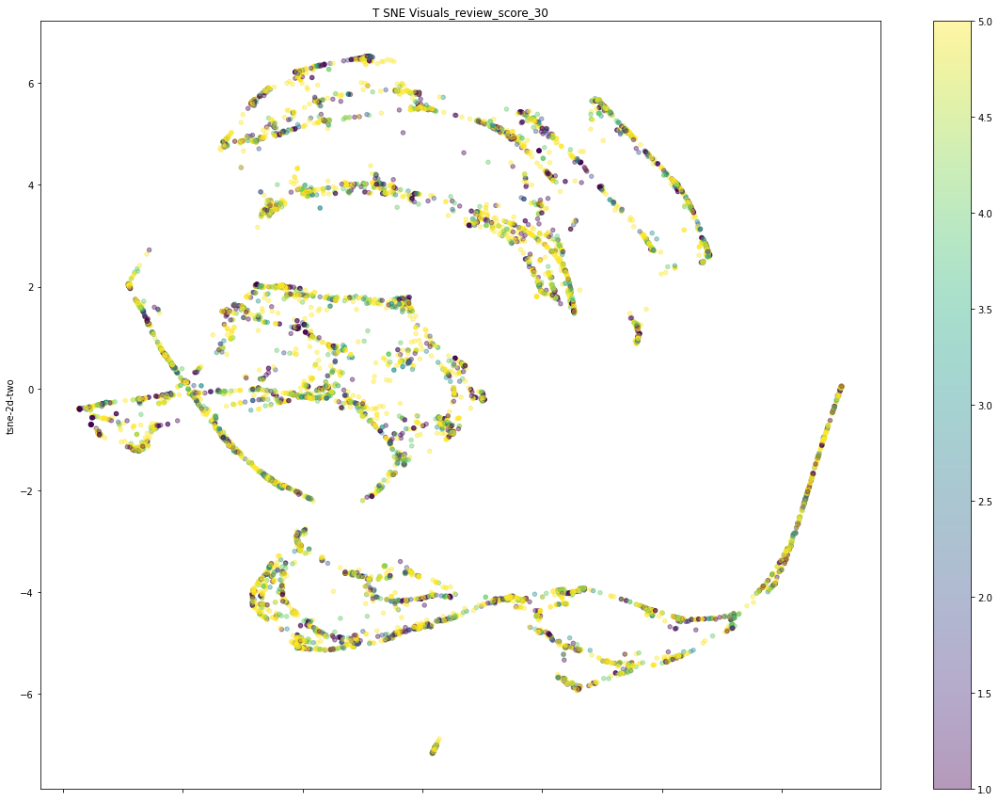

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.296s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.984360
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

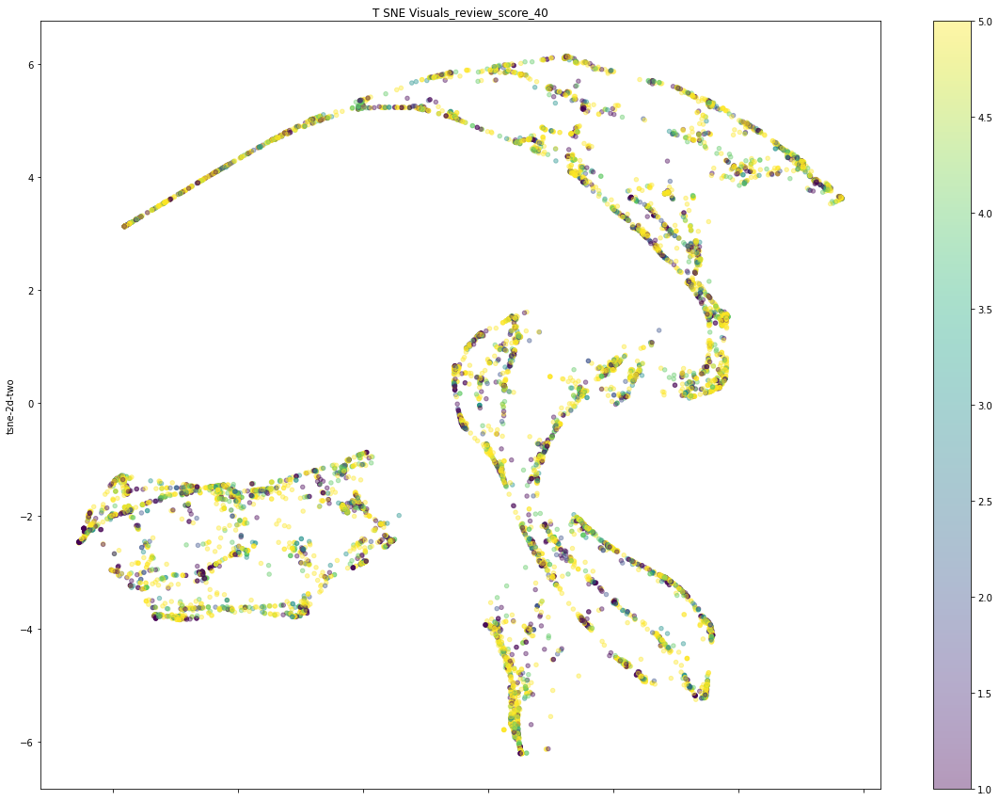

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.116s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.088776
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

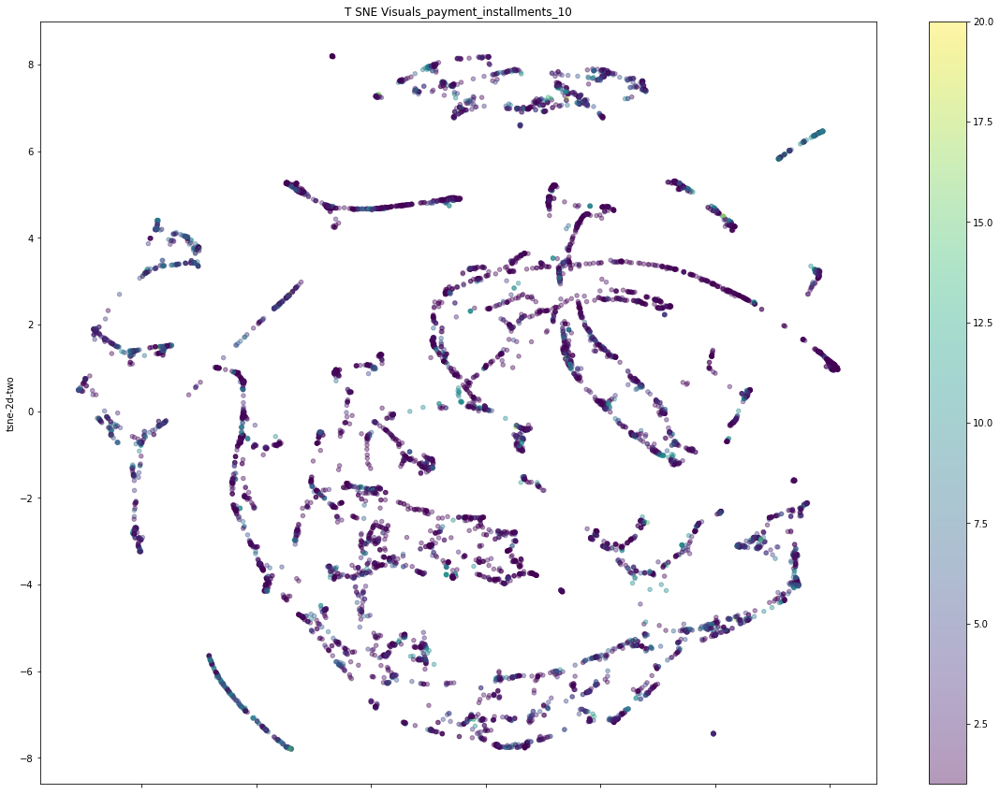

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.181s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.495682
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

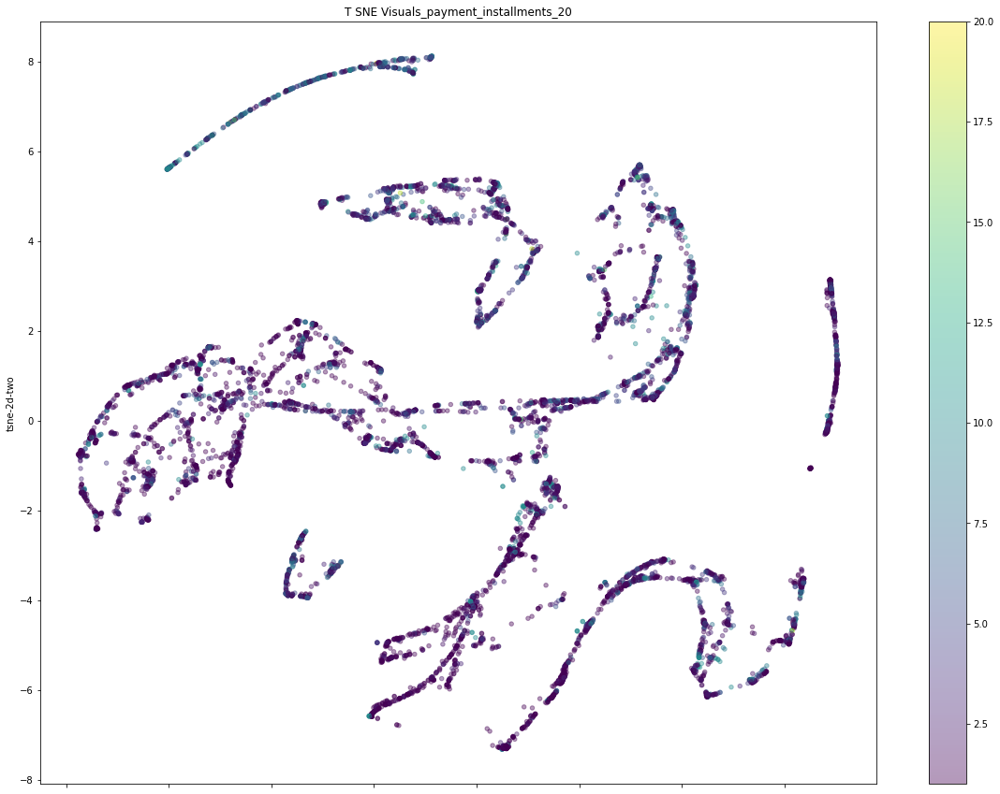

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.006s...
[t-SNE] Computed neighbors for 9494 samples in 0.244s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.358231
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

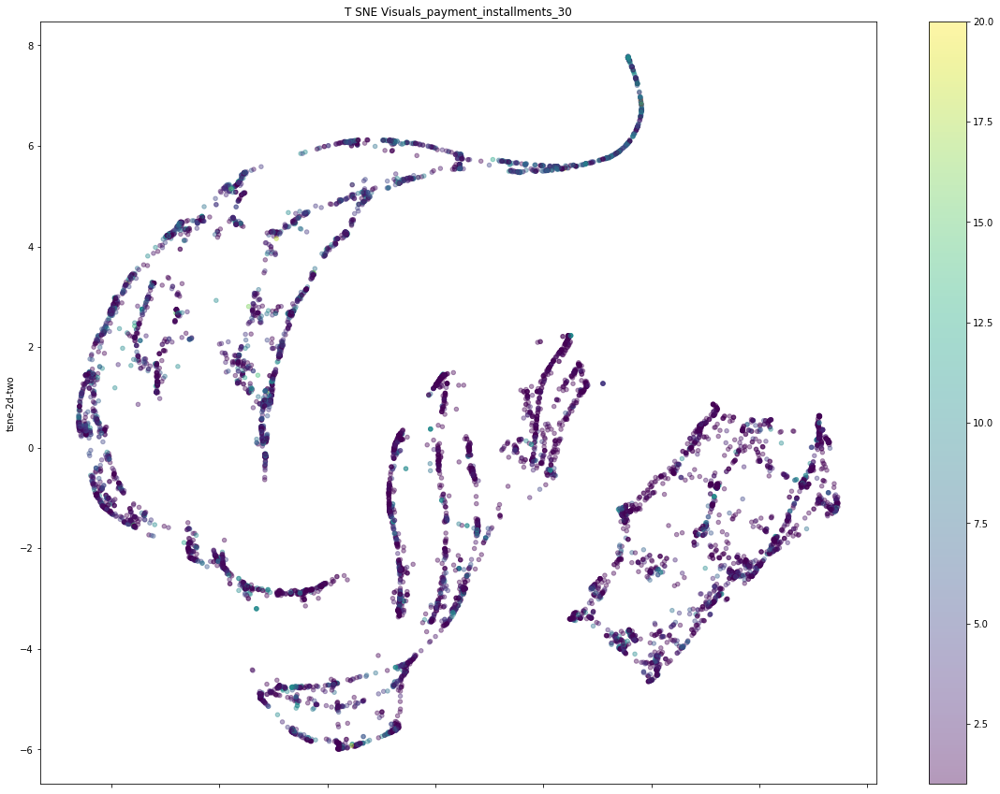

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.291s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.014931
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

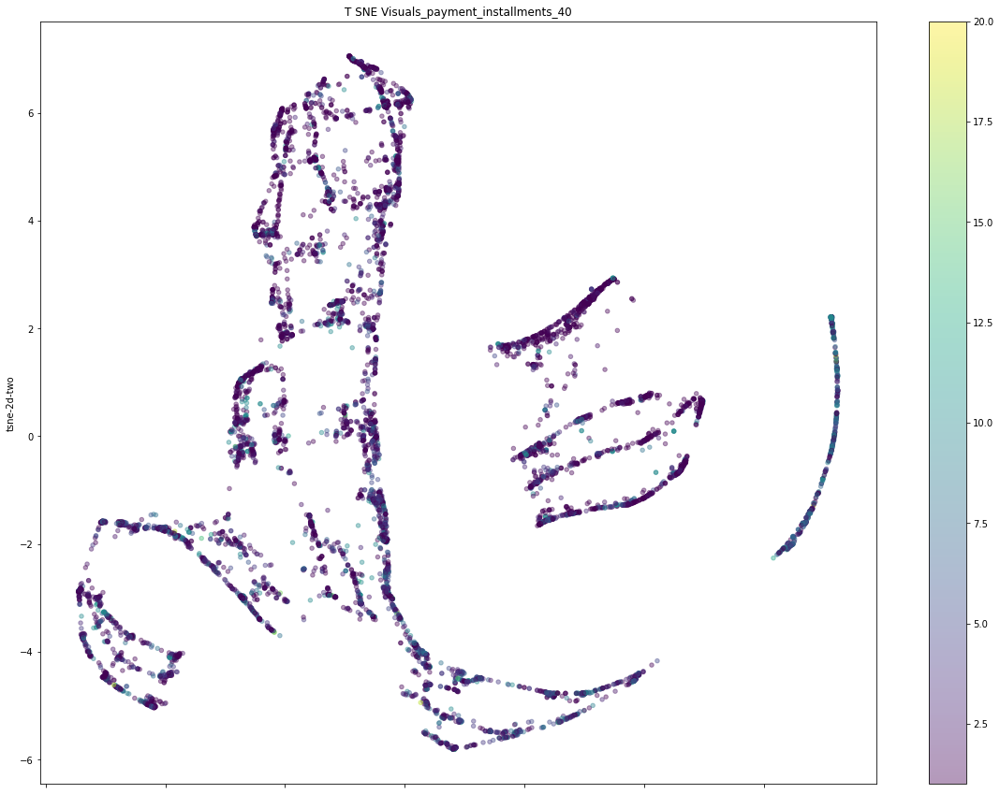

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.120s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.399117
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

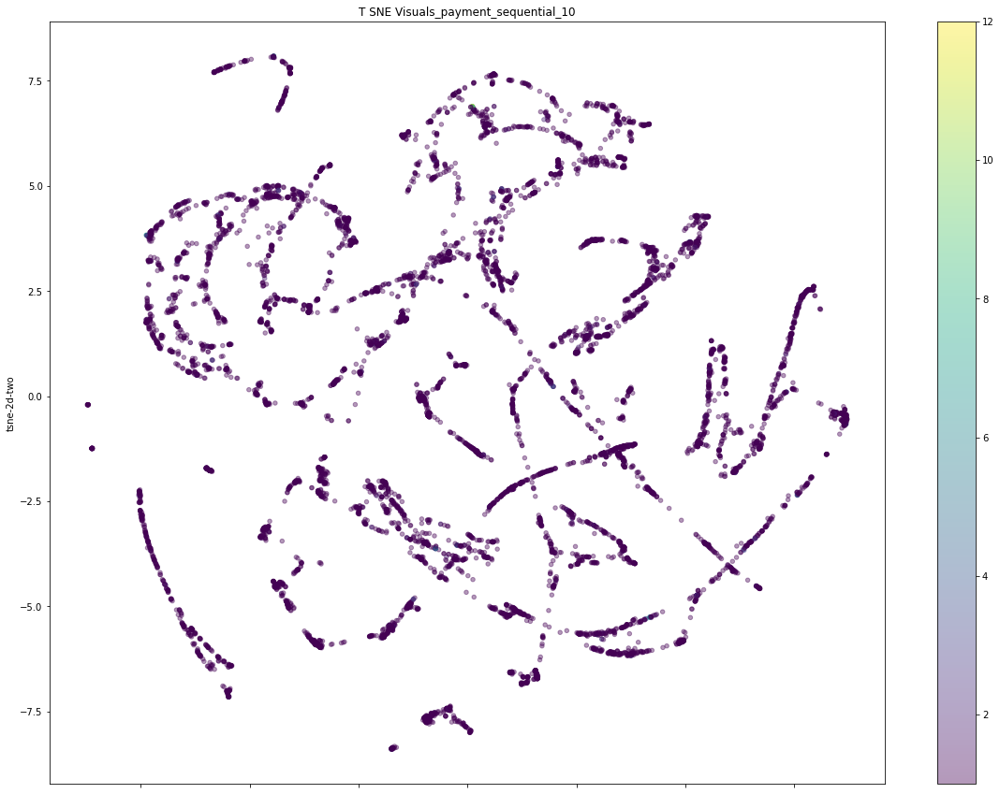

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.177s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.294189
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

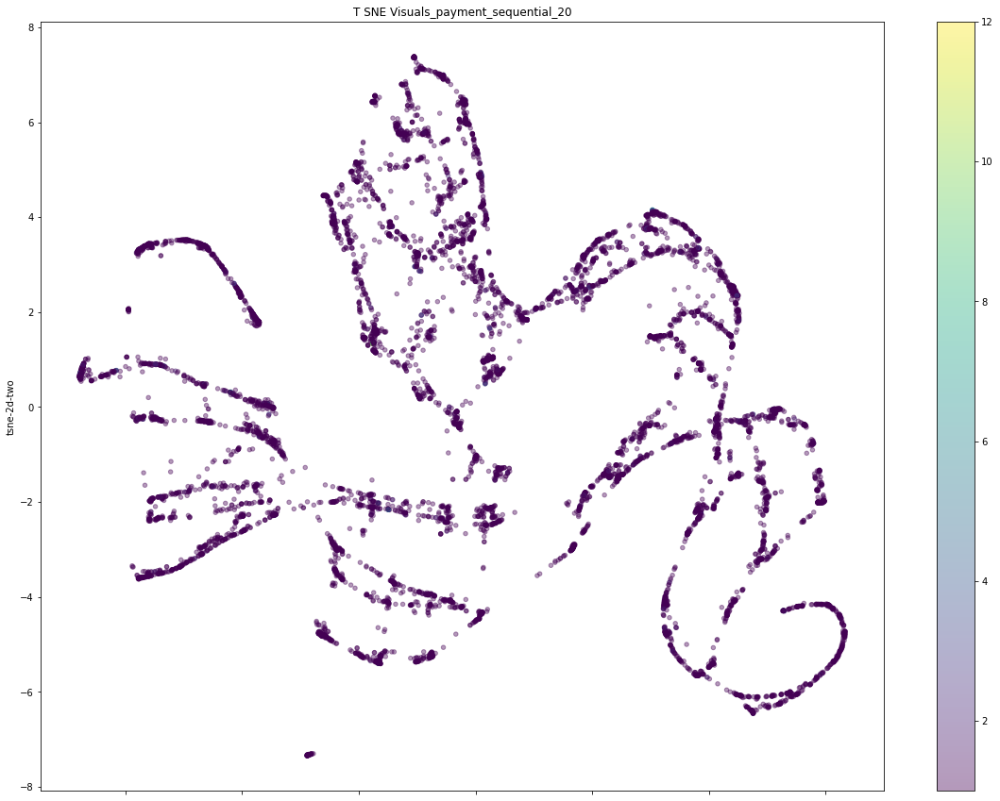

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.245s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.436104
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

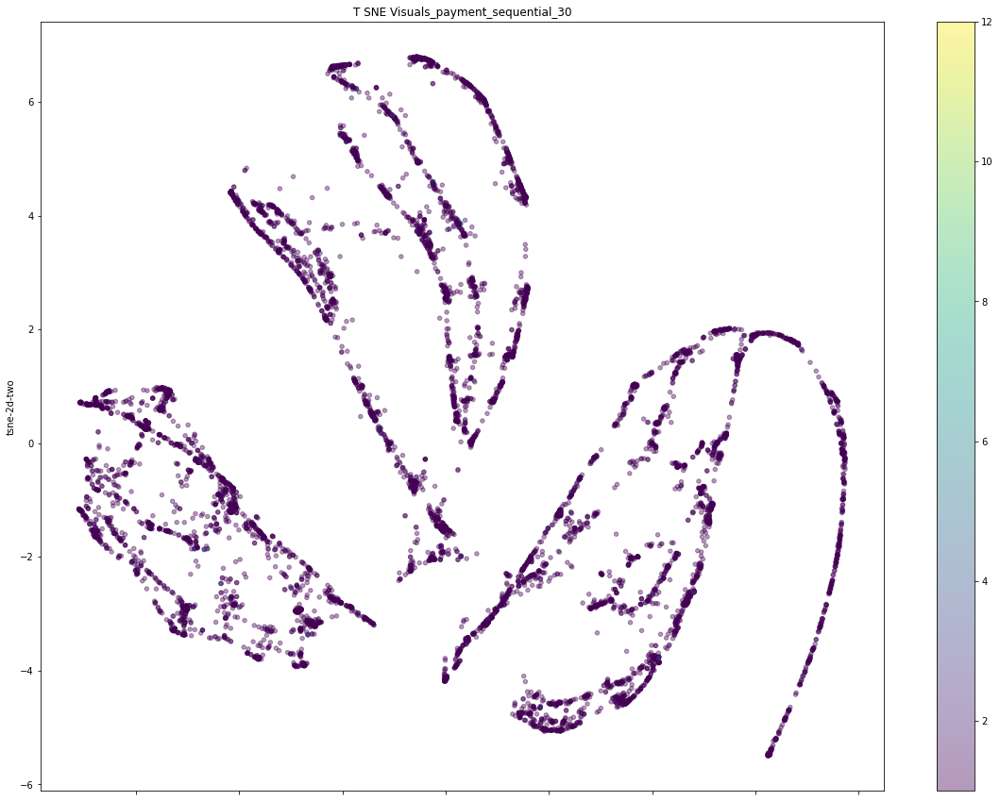

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.303s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.631111
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

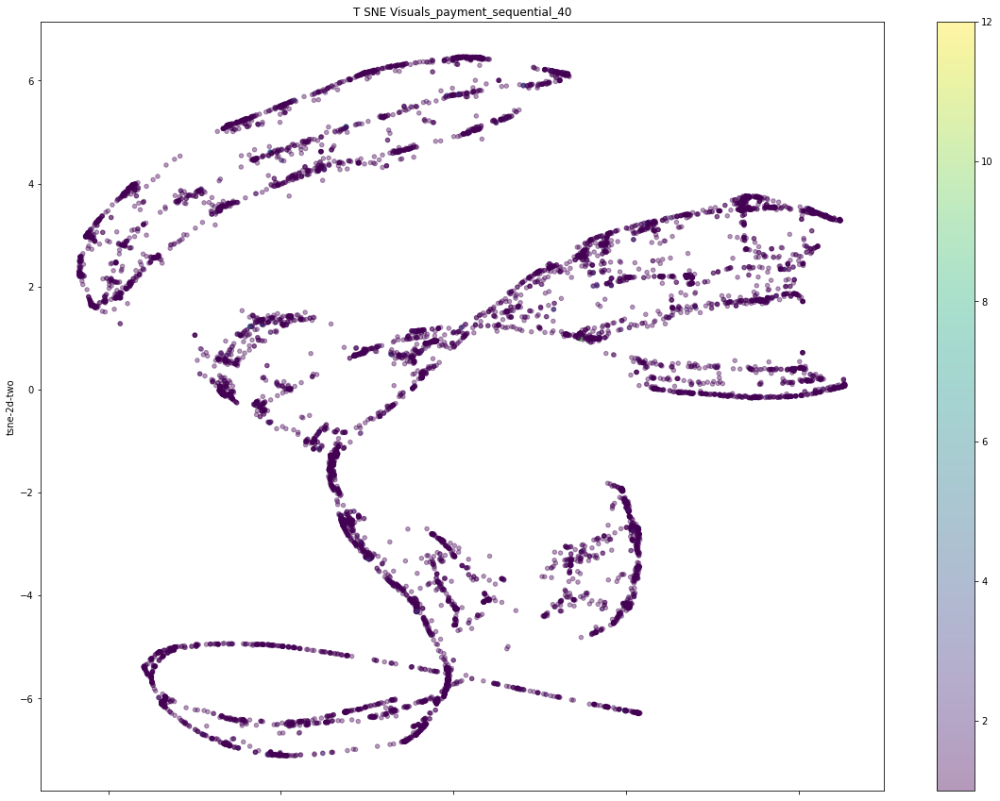

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.006s...
[t-SNE] Computed neighbors for 9494 samples in 0.115s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.091904
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

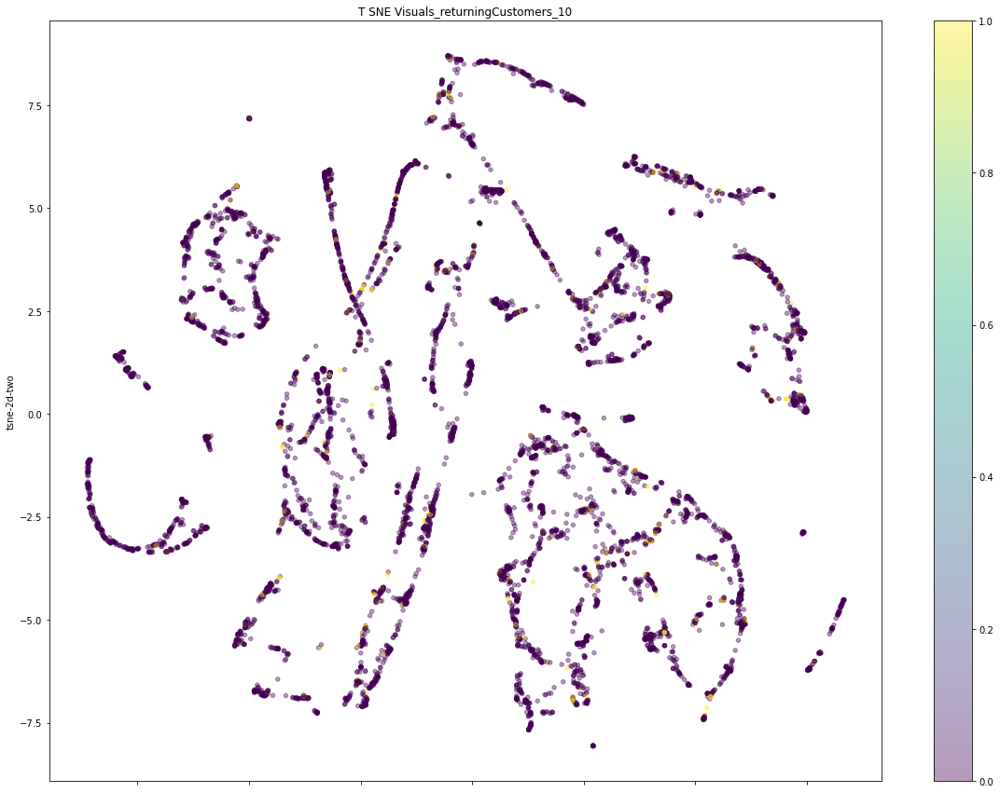

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.006s...
[t-SNE] Computed neighbors for 9494 samples in 0.181s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.149826
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

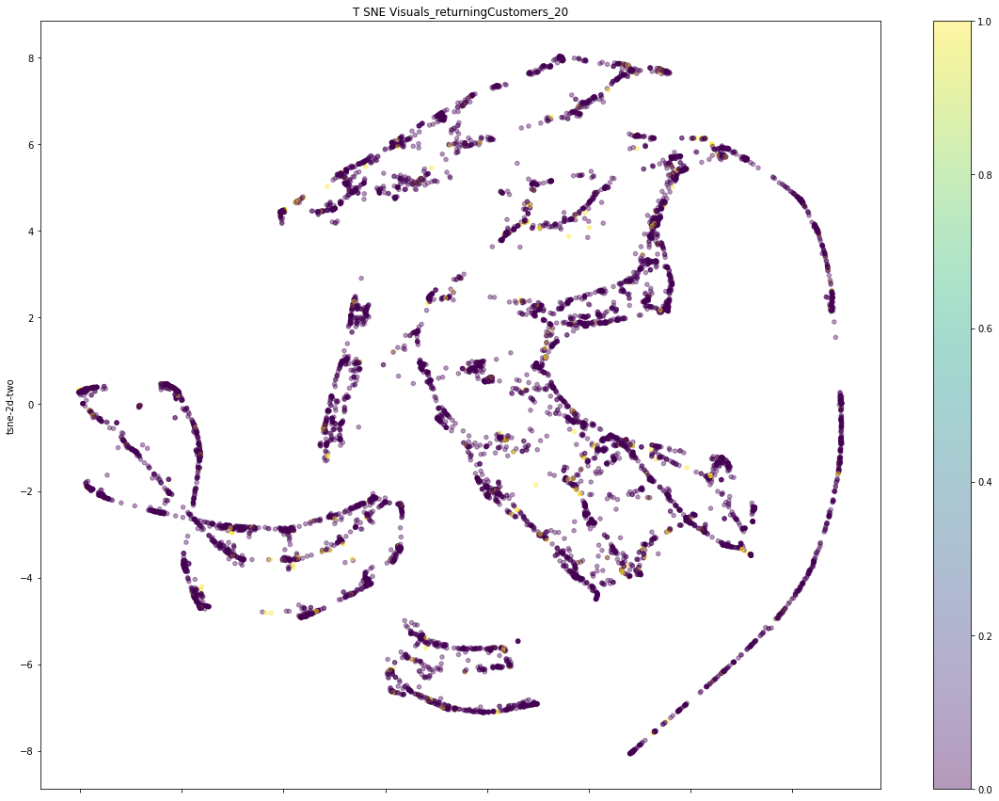

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.244s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.646896
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

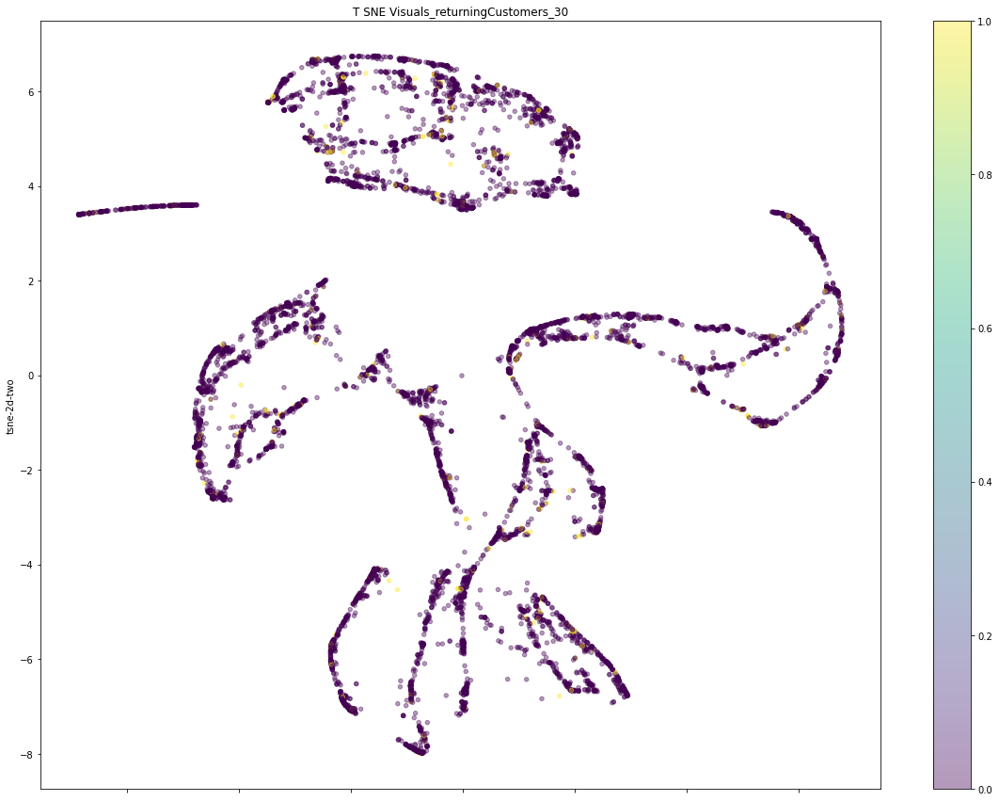

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.303s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.866486
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

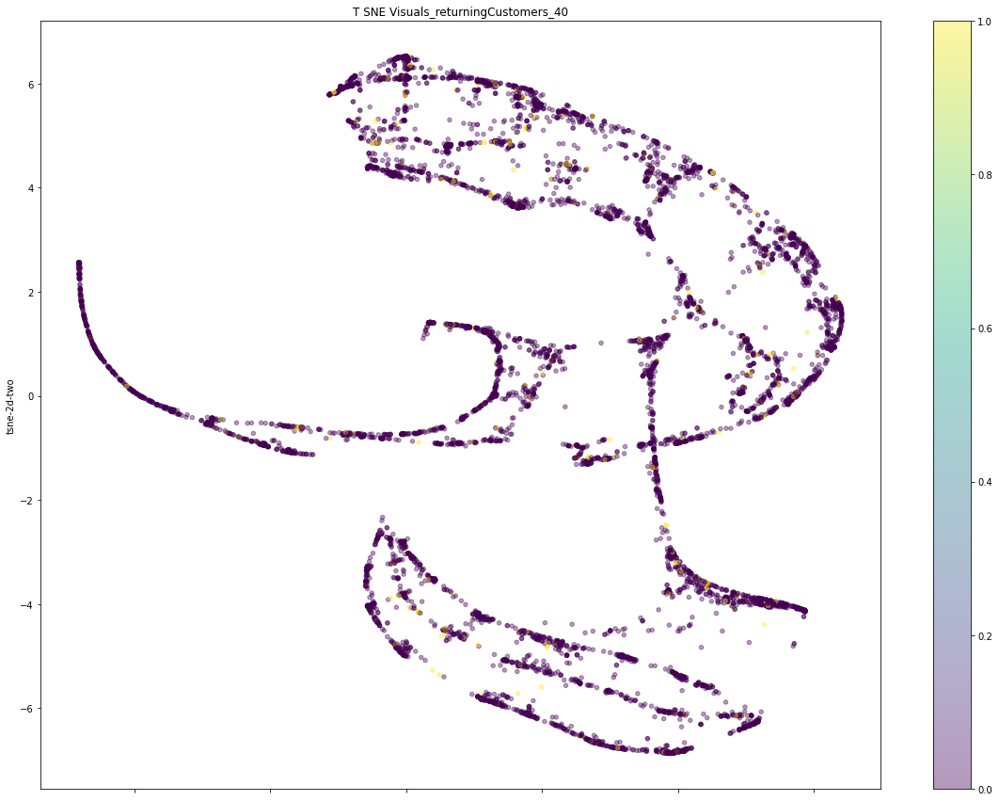

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.115s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.312286
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

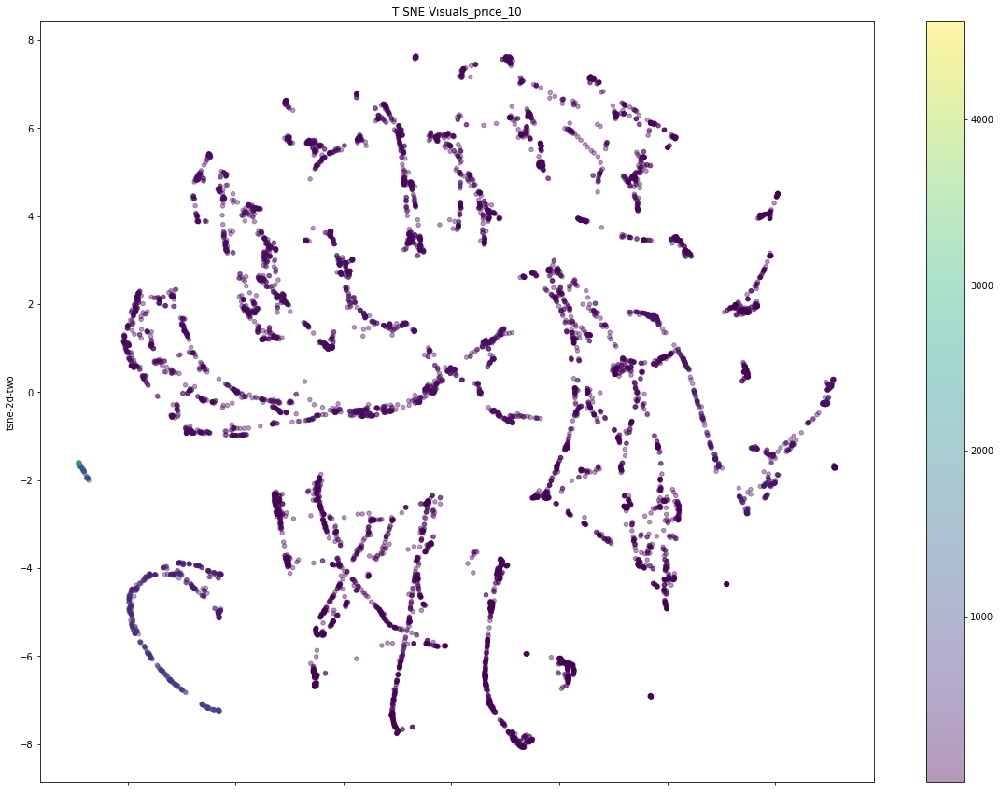

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.185s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 2.745039
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.223770
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

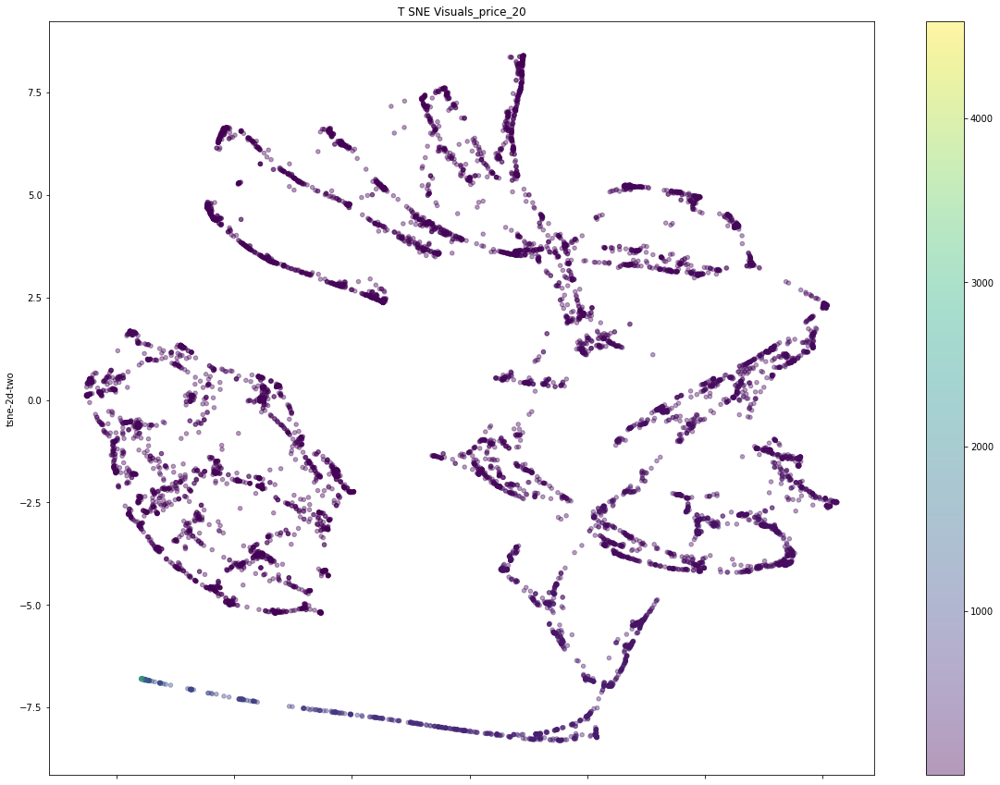

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.244s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.274415
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.306183
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525

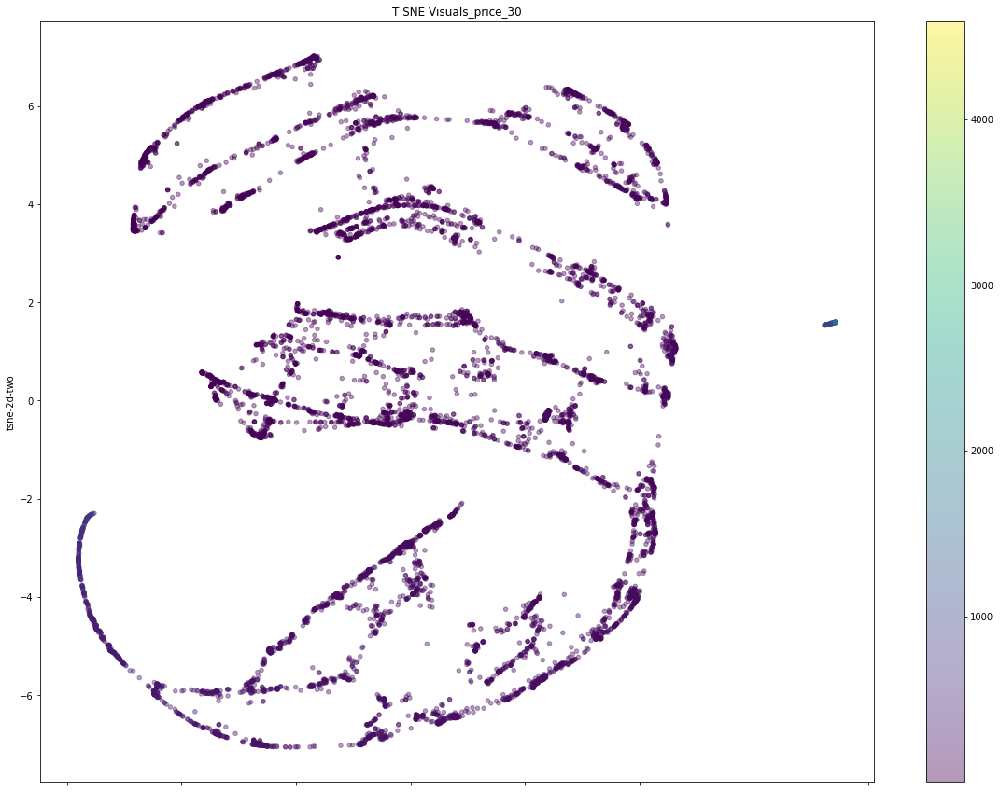

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 9494 samples in 0.007s...
[t-SNE] Computed neighbors for 9494 samples in 0.300s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9494
[t-SNE] Computed conditional probabilities for sample 2000 / 9494
[t-SNE] Computed conditional probabilities for sample 3000 / 9494
[t-SNE] Computed conditional probabilities for sample 4000 / 9494
[t-SNE] Computed conditional probabilities for sample 5000 / 9494
[t-SNE] Computed conditional probabilities for sample 6000 / 9494
[t-SNE] Computed conditional probabilities for sample 7000 / 9494
[t-SNE] Computed conditional probabilities for sample 8000 / 9494
[t-SNE] Computed conditional probabilities for sample 9000 / 9494
[t-SNE] Computed conditional probabilities for sample 9494 / 9494
[t-SNE] Mean sigma: 3.699470
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.033417
[t-SNE] KL divergence after 251 iterations: 17976931348623157081452742373170435679807056752

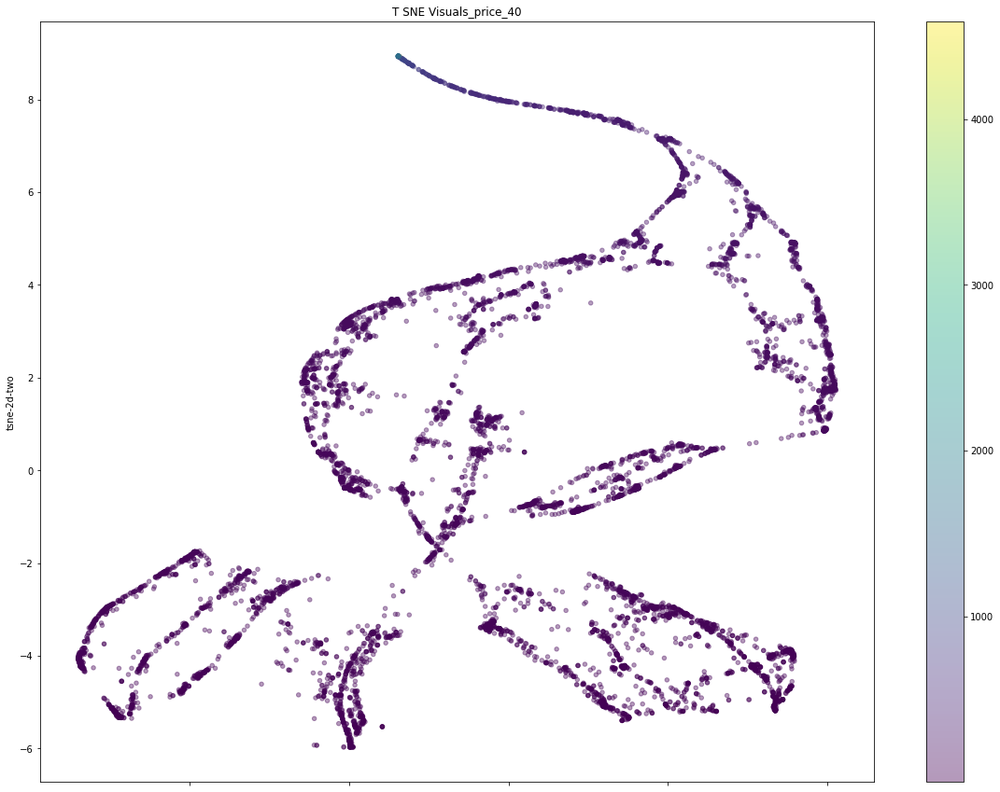

330.53295636177063


In [70]:
time_start = time.time()
resultFrame = pd.DataFrame(columns=["tsne-2d-one", "tsne-2d-two"])

filterC = newCols + list(intColumn["columns"].values)
filterC  = filterC + list(floatColumn["columns"].values)

filterC.remove("order_item_id")
toDrop = ["product_weight_g",
 'product_length_cm',
 'product_height_cm',
 'product_width_cm',
 "customer_zip_code_prefix", 
          "freight_value", "payment_value", 
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty', "seller_zip_code_prefix", "seller_stateEnc"]

for drop in toDrop:
    print(drop)
    filterC.remove(drop)
filterC

print(filterC)
print("columns", mergedFrame.dropna().filter(items=filterC).columns)

for column in filterC: 
    for perpl in range(10, 50, 10):
        
        tsne = TSNE(n_components=2, verbose=1, perplexity=perpl, n_iter=250)
        tsne_results = tsne.fit_transform(mergedFrame1000.dropna().filter(items=filterC).values)


        resultFrame['tsne-2d-one'] = tsne_results[:,0]
        resultFrame['tsne-2d-two'] = tsne_results[:,1]

 
        colors = mergedFrame1000.dropna()[column].values
    
        title = "T SNE Visuals_"+column+"_"+str(perpl)
        figure = resultFrame.plot.scatter(x="tsne-2d-one",
                              figsize=(20,15), 
                              y="tsne-2d-two",
                              c=colors, 
                              title=title, 
                              xlabel="tsne-2d-one", 
                              #xscale={"linear"},
                              marker = 'o',   alpha = 0.4, 
                              colormap='viridis').get_figure()
        plt.show()
        figure.savefig(title+".jpg")
print(str(time.time()-time_start))   

# Kmeans 

Prototype-based clustering means that each cluster is represented by a prototype, which can either be the centroid (average) of similar points with continuous features, or the medoid (the most representative or most frequently occurring point) in the case of categorical features.


While k-means is very good at identifying <b>clusters with a spherical shape</b>, one of the drawbacks of this clustering algorithm is that we have to specify the number of clusters, k, a priori. An inappropriate choice for k can result in poor clustering performance — we will discuss later in this tutorial how to choose k.

### Centroid

In [68]:
from sklearn.cluster import KMeans




filterC = newCols + list(intColumn["columns"].values)
filterC  = filterC + list(floatColumn["columns"].values)

filterC.remove("order_item_id")
toDrop = ["product_weight_g",
 'product_length_cm',
 'product_height_cm',
 'product_width_cm',
 "customer_zip_code_prefix", 
          "freight_value", "payment_value", 
 'product_name_lenght',
 'product_description_lenght',
 'product_photos_qty', "seller_zip_code_prefix", "seller_stateEnc"]

for drop in toDrop:
    print(drop)
    filterC.remove(drop)
filterC

print(filterC)

Xkmeans = mergedFrame1000.dropna().filter(items=filterC).values
Xscaled = preprocessing.StandardScaler().fit_transform(Xkmeans)

km = KMeans(
    n_clusters=3, init='k-means++',
    n_init=5, max_iter=1000, 
    tol=1e-04, random_state=1234
)
y_km = km.fit_predict(Xscaled)

product_weight_g
product_length_cm
product_height_cm
product_width_cm
customer_zip_code_prefix
freight_value
payment_value
product_name_lenght
product_description_lenght
product_photos_qty
seller_zip_code_prefix
seller_stateEnc
['payment_typeEnc', 'customer_stateEnc', 'order_statusEnc', 'product_category_nameEnc', 'NbReviews', 'nbOrders', 'review_score', 'payment_installments', 'payment_sequential', 'returningCustomers', 'price']


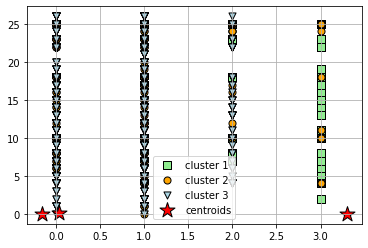

In [69]:
# plot the 3 clusters
plt.scatter(
    X[y_km == 0, 0], X[y_km == 0, 1],
    s=50, c='lightgreen',
    marker='s', edgecolor='black',
    label='cluster 1'
)

plt.scatter(
    X[y_km == 1, 0], X[y_km == 1, 1],
    s=50, c='orange',
    marker='o', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X[y_km == 2, 0], X[y_km == 2, 1],
    s=50, c='lightblue',
    marker='v', edgecolor='black',
    label='cluster 3'
)

#plt.scatter(
#    X[y_km == 3, 0], X[y_km == 3, 1],
#    s=50, c='lightblue',
#    marker='v', edgecolor='black',
#    label='cluster 4'
#)


#plt.scatter(
#    X[y_km == 4, 0], X[y_km == 4, 1],
#    s=50, c='lightblue',
#    marker='v', edgecolor='black',
#    label='cluster 5'
#)


# plot the centroids
plt.scatter(
    km.cluster_centers_[:, 0], km.cluster_centers_[:, 1],
    s=250, marker='*',
    c='red', edgecolor='black',
    label='centroids'
)
plt.legend(scatterpoints=1)
plt.grid()
plt.show()

### Medoid

# The Elbow Method

The elbow method is a useful graphical tool to estimate the optimal number of clusters k for a given task. Intuitively, we can say that, if k increases, the within-cluster SSE (“distortion”) will decrease. This is because the samples will be closer to the centroids they are assigned to.

# DbScan Clustering
